In [ ]:
train = tf.data.Dataset.from_tensor_slices((X_train, y_train))
valid = tf.data.Dataset.from_tensor_slices((X_valid, y_valid))

train = train.shuffle(buffer_size=400).batch(batch_size=16)
valid = valid.shuffle(buffer_size=400).batch(batch_size=16)

In [ ]:
gen_model = create_mod_unet()
dis_models = [create_patchgan((128, 128, 3)), create_patchgan((64, 64, 3)), create_patchgan((32, 32, 3))]

LAMBDA=100
optimizer_params = { "learning_rate": 0.0002,"beta_1": 0.5,"beta_2": 0.999}

gen_opt = tf.keras.optimizers.Adam(**optimizer_params)
dis_opt_0 = tf.keras.optimizers.Adam(**optimizer_params)
dis_opt_1 = tf.keras.optimizers.Adam(**optimizer_params)
dis_opt_2 = tf.keras.optimizers.Adam(**optimizer_params)

bce_loss = keras.losses.BinaryCrossentropy(from_logits=True)

# **Loss Functions**
defining custom loss functions for the generator and discriminator.

In [ ]:
def gen_loss(dis_gen_out, target_img, gen_img):
    adv_loss = bce_loss(tf.ones_like(dis_gen_out), dis_gen_out)
    l1_loss = tf.reduce_mean(tf.abs(tf.subtract(target_img, gen_img)))
    total_loss = adv_loss + (LAMBDA * l1_loss)
    return total_loss, adv_loss, l1_loss

def dis_loss(dis_gen_out, dis_target_out):
    gen_loss = bce_loss(tf.zeros_like(dis_gen_out), dis_gen_out)
    target_loss = bce_loss(tf.ones_like(dis_target_out), dis_target_out)
    total_dis_loss = gen_loss + target_loss
    return total_dis_loss

## **Training Loop**
 Training loop where train the GAN model. Here, iterate through the dataset and update the generator and discriminator based on their respective losses.

In [ ]:
@tf.function
def train_batch(bw_img, tar_img):
    def resize_and_compute_losses(resized_tar_img, resized_bw_img, resized_gen_img, dis_model, dis_gen_out, tar_img, gen_img):
        dis_out = dis_model([resized_bw_img, resized_tar_img], training=True)
        g_loss, _, _ = gen_loss(dis_gen_out, tar_img, gen_img)
        d_loss = dis_loss(dis_gen_out, dis_out)
        return g_loss, d_loss

    with tf.GradientTape(persistent=True) as g:
        gen_img = gen_model(bw_img, training=True)
        g_losses = []
        d_losses = []

        resolutions = [(128, 128), (64, 64), (32, 32)]

        for resolution, dis_model in zip(resolutions, dis_models):
            resized_tar_img = tf.image.resize(tar_img, resolution)
            resized_bw_img = tf.image.resize(bw_img, resolution)
            resized_gen_img = tf.image.resize(gen_img, resolution)
            dis_gen_out = dis_model([resized_bw_img, resized_gen_img], training=True)
            g_loss, d_loss = resize_and_compute_losses(resized_tar_img, resized_bw_img, resized_gen_img, dis_model, dis_gen_out, tar_img, gen_img)
            g_losses.append(g_loss)
            d_losses.append(d_loss)

        g_total_loss = sum(g_losses)
        d_total_loss = sum(d_losses)

    g_gradients = g.gradient(g_total_loss, gen_model.trainable_variables)
    d_gradients = [g.gradient(d_loss, dis_model.trainable_variables) for d_loss, dis_model in zip(d_losses, dis_models)]

    gen_opt.apply_gradients(zip(g_gradients, gen_model.trainable_variables))
    for dis_opt, d_grad, dis_model in zip([dis_opt_0, dis_opt_1, dis_opt_2], d_gradients, dis_models):
        dis_opt.apply_gradients(zip(d_grad, dis_model.trainable_variables))

In [ ]:
def plot_images(bw_img, gen_img, tar_img):
    plt.figure(figsize=(20, 20))

    images = [bw_img, gen_img, tar_img]
    titles = ['Gray Scale', 'Generated', 'Ground Truth']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.imshow((images[i][0] + 1.0) / 2.0)
        plt.title(titles[i], fontsize=20)
        plt.axis('off')

    plt.show()

for gry, clr in train.take(1) :
    pass

def fit(EPOCHS=400):
    for epoch in range(EPOCHS):
        print(f'Epoch {epoch} out of {EPOCHS}')
        progress_bar = tqdm(train, total=len(train))

        for bw_image, tar_image in progress_bar:
            train_batch(bw_image, tar_image)

        if epoch % 3 == 0:
            gen_image = gen_model(gry, training=True)
            plot_images(gry, gen_image, clr)


Epoch 0 out of 300


  0%|          | 0/282 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/keras/backend.py:5703: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
100%|██████████| 282/282 [00:59<00:00,  4.77it/s]


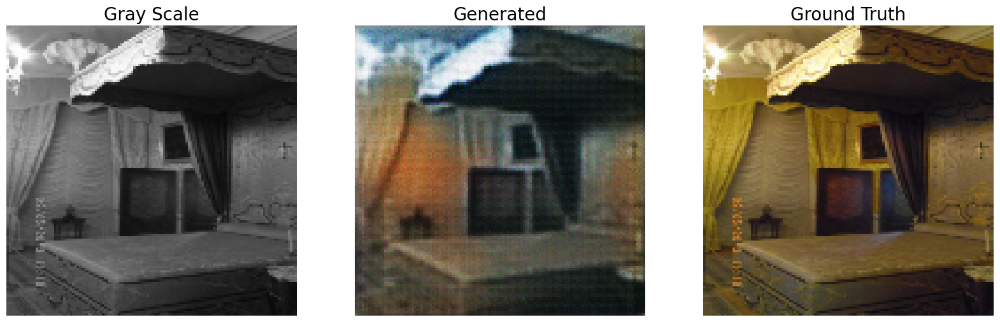

Epoch 1 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.90it/s]


Epoch 2 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.89it/s]


Epoch 3 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.94it/s]


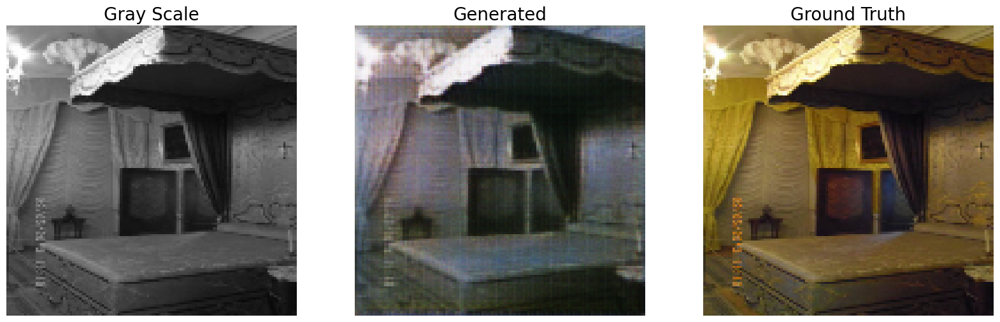

Epoch 4 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.90it/s]


Epoch 5 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.94it/s]


Epoch 6 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.90it/s]


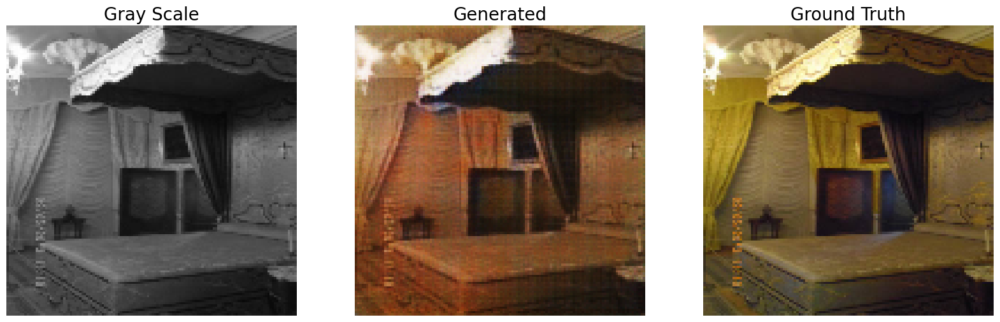

Epoch 7 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.95it/s]


Epoch 8 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


Epoch 9 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


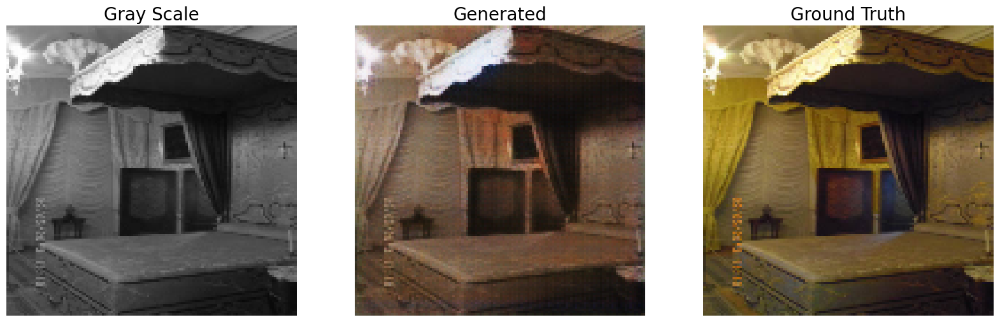

Epoch 10 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 11 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.04it/s]


Epoch 12 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.05it/s]


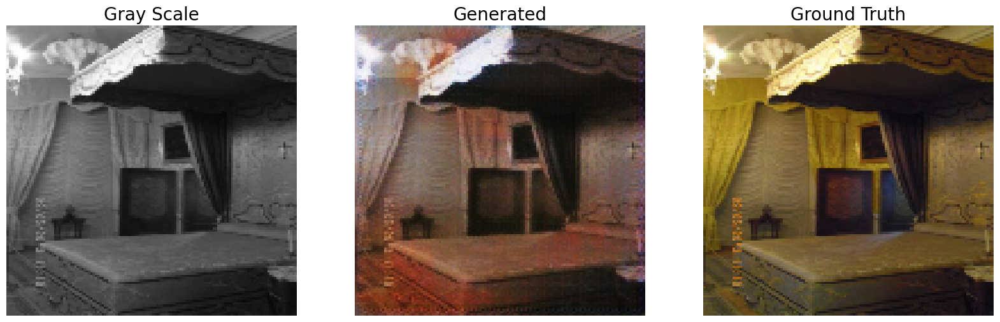

Epoch 13 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 14 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


Epoch 15 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


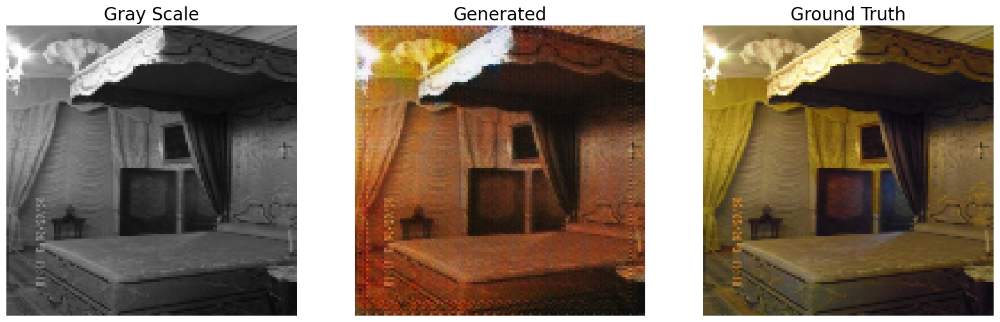

Epoch 16 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


Epoch 17 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 18 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


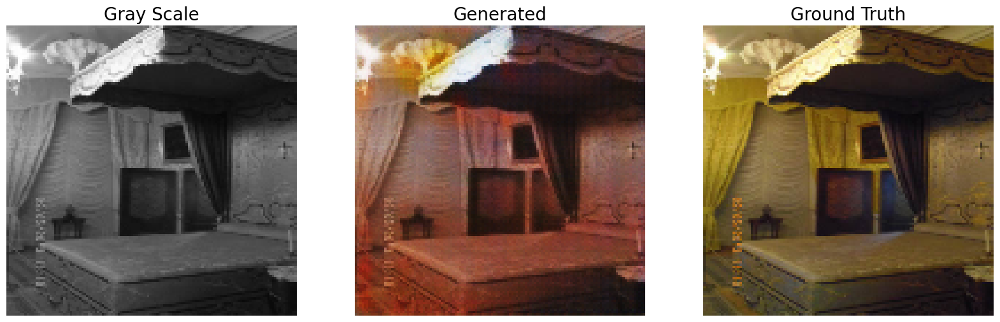

Epoch 19 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.04it/s]


Epoch 20 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.04it/s]


Epoch 21 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


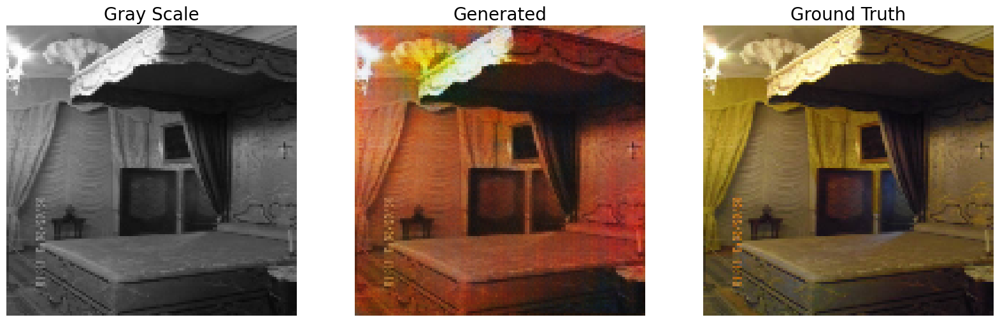

Epoch 22 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


Epoch 23 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


Epoch 24 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


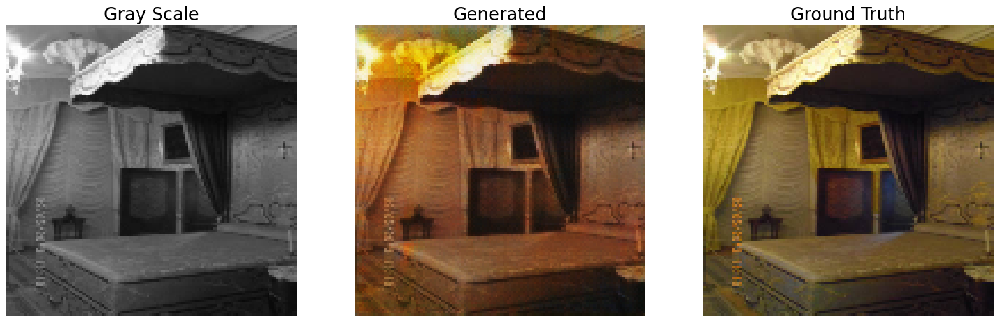

Epoch 25 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


Epoch 26 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.04it/s]


Epoch 27 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.04it/s]


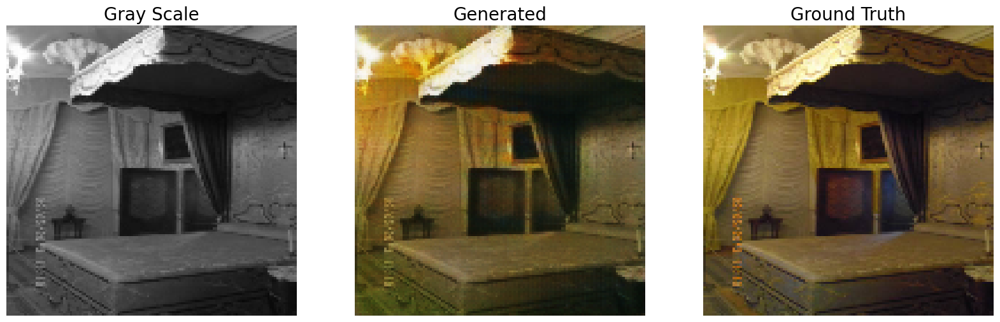

Epoch 28 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 29 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 30 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


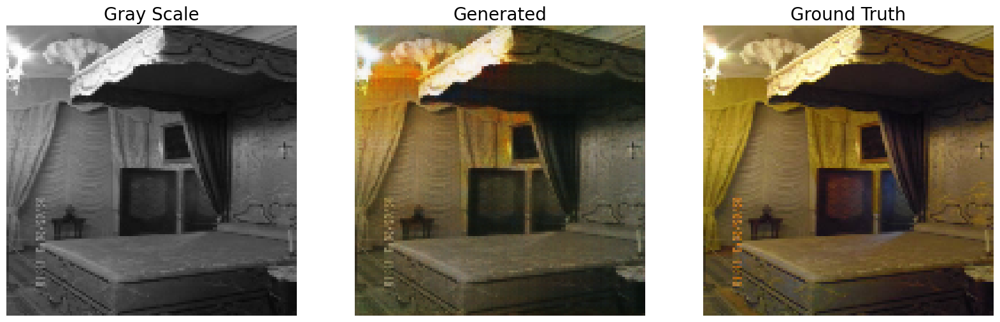

Epoch 31 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 32 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


Epoch 33 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


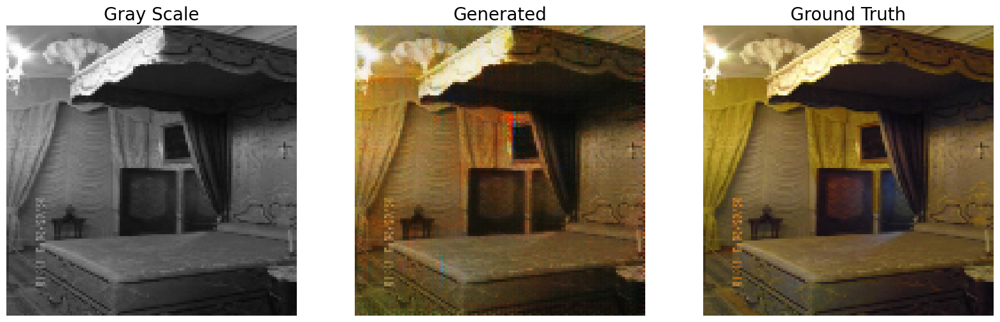

Epoch 34 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 35 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


Epoch 36 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


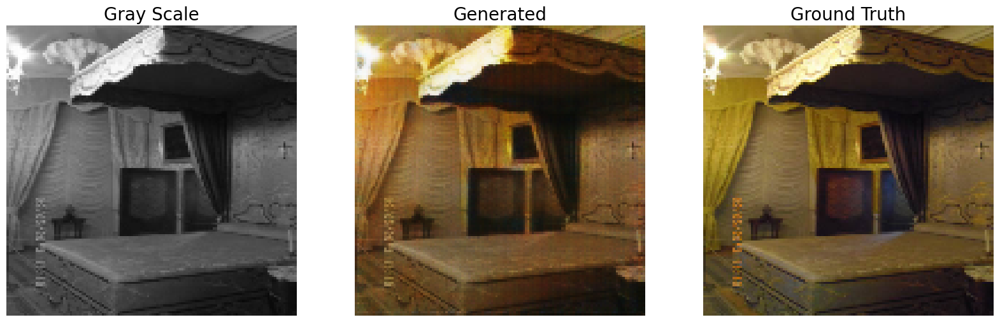

Epoch 37 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 38 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


Epoch 39 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.97it/s]


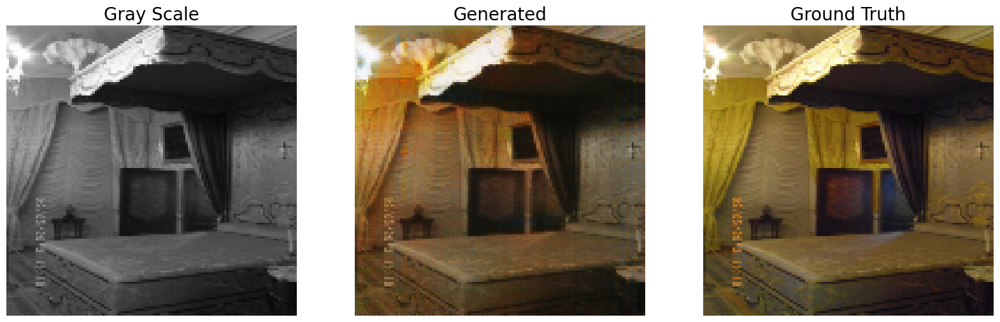

Epoch 40 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


Epoch 41 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 42 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


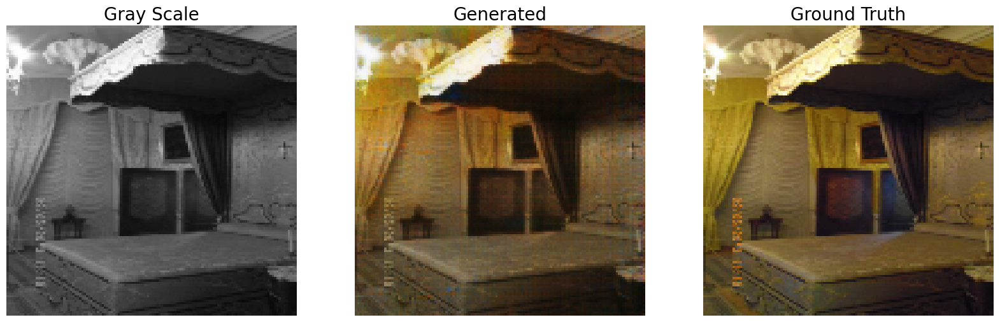

Epoch 43 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.93it/s]


Epoch 44 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 45 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


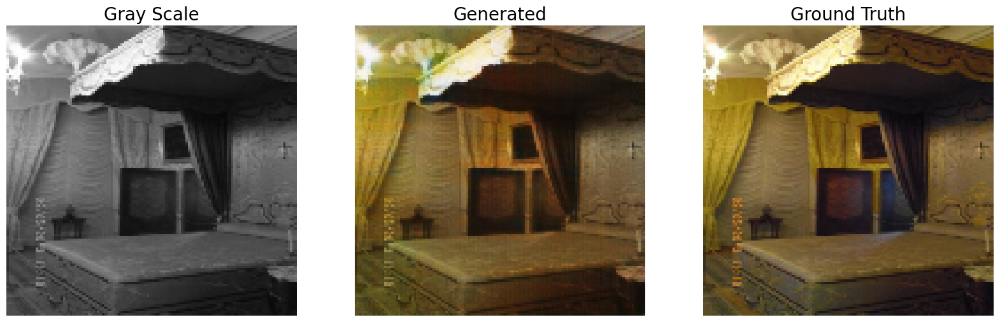

Epoch 46 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.97it/s]


Epoch 47 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 48 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


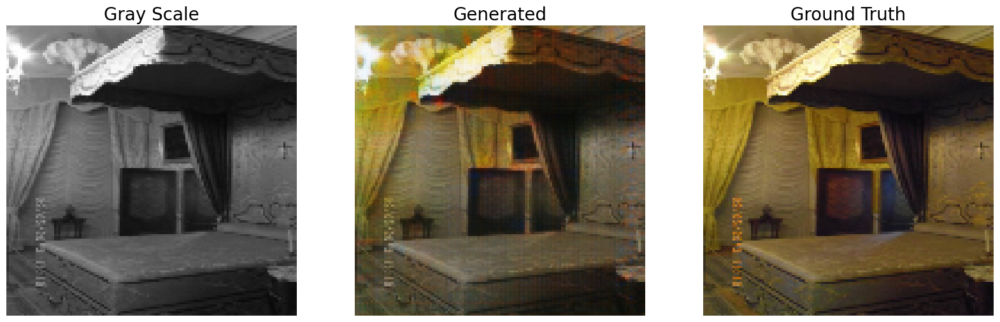

Epoch 49 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.84it/s]


Epoch 50 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


Epoch 51 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


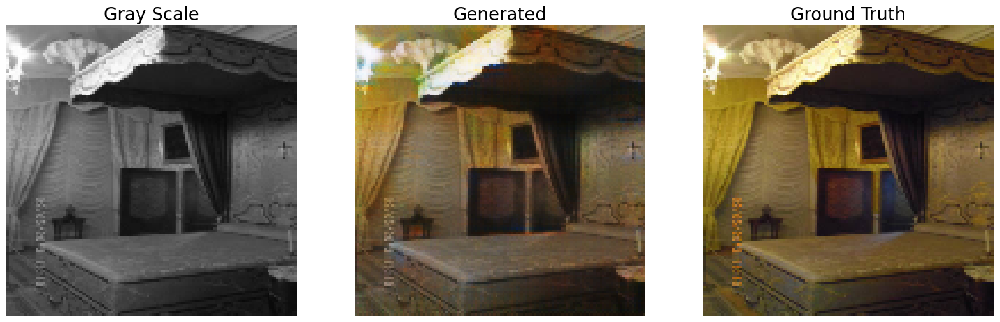

Epoch 52 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.77it/s]


Epoch 53 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.96it/s]


Epoch 54 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.97it/s]


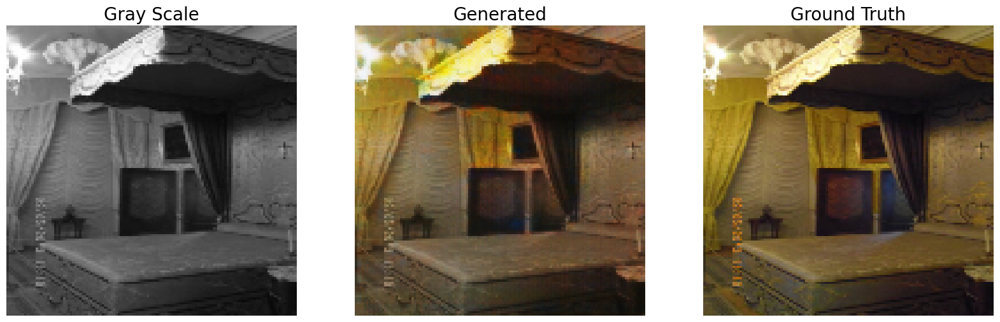

Epoch 55 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


Epoch 56 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


Epoch 57 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.97it/s]


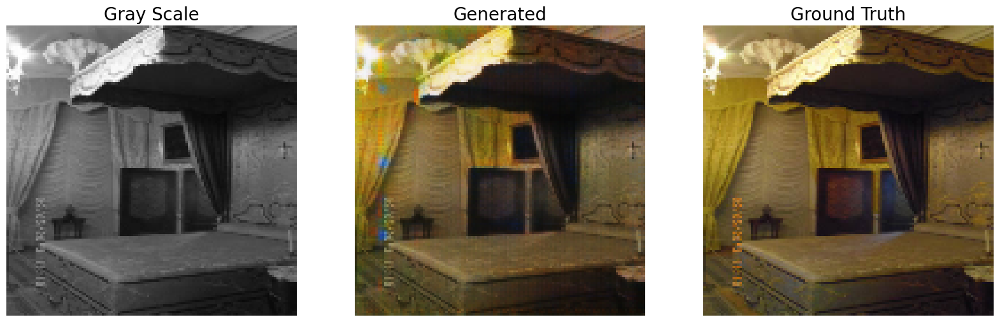

Epoch 58 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 59 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 60 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


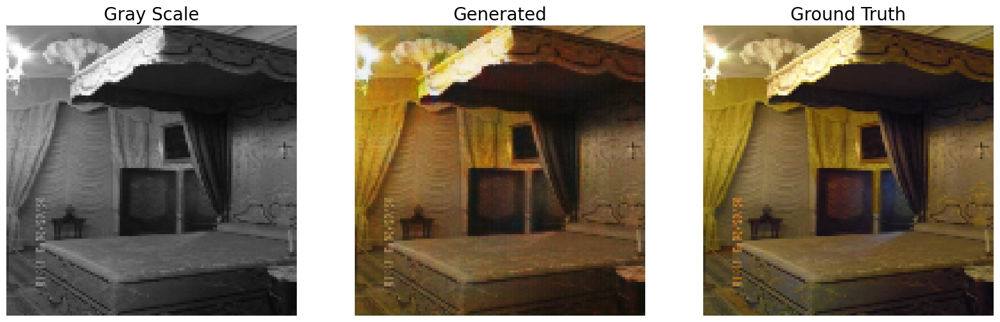

Epoch 61 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 62 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


Epoch 63 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


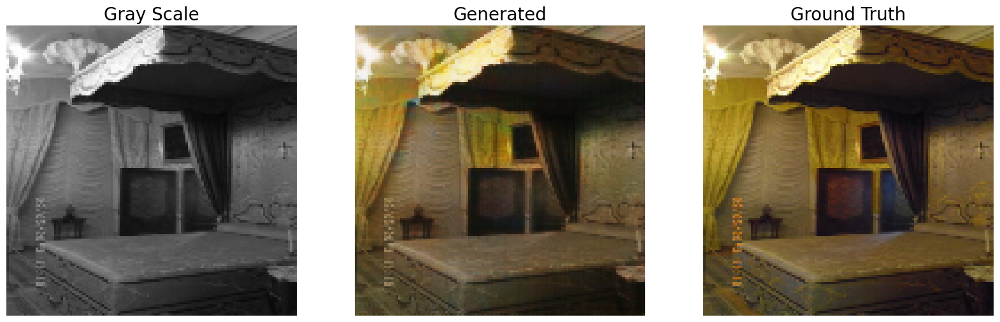

Epoch 64 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


Epoch 65 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.97it/s]


Epoch 66 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


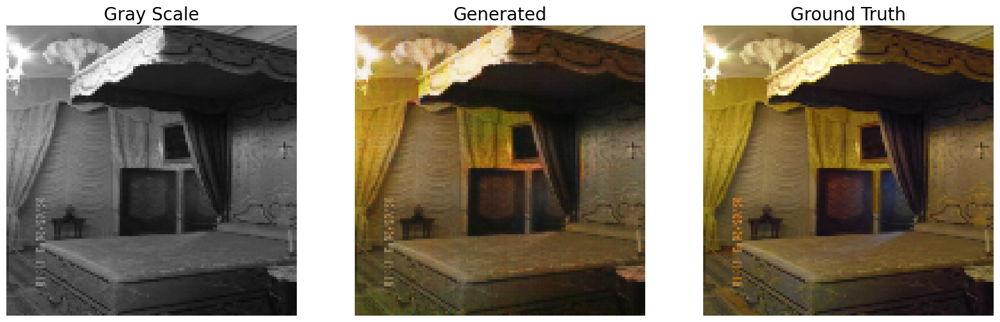

Epoch 67 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 68 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.05it/s]


Epoch 69 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


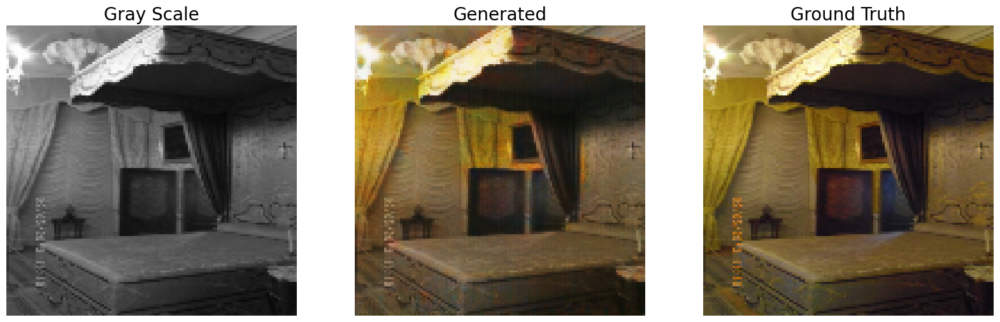

Epoch 70 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 71 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


Epoch 72 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


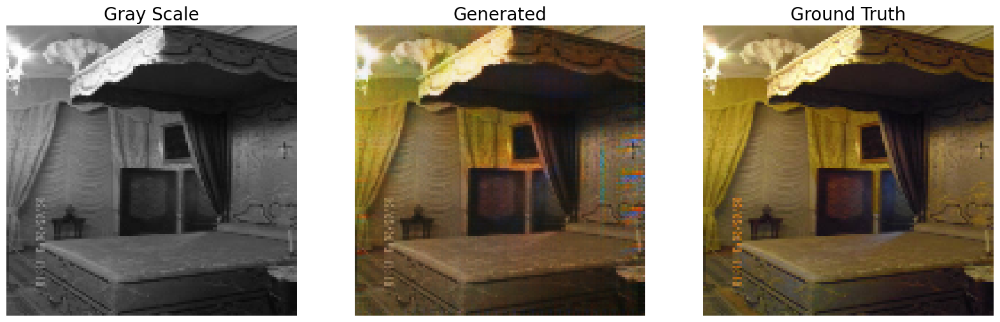

Epoch 73 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 74 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


Epoch 75 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


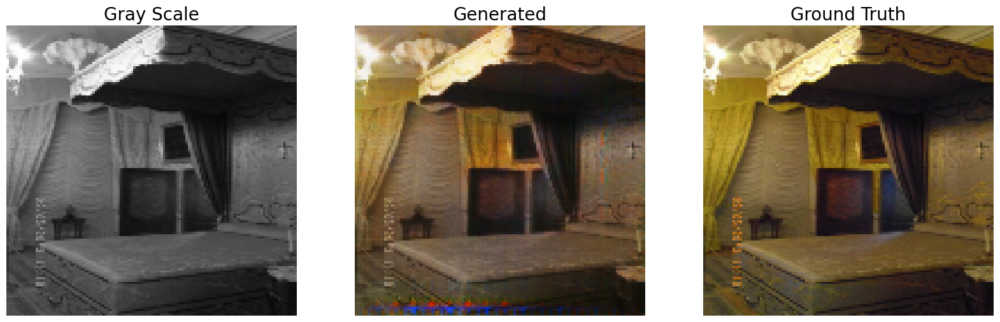

Epoch 76 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.06it/s]


Epoch 77 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.05it/s]


Epoch 78 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.05it/s]


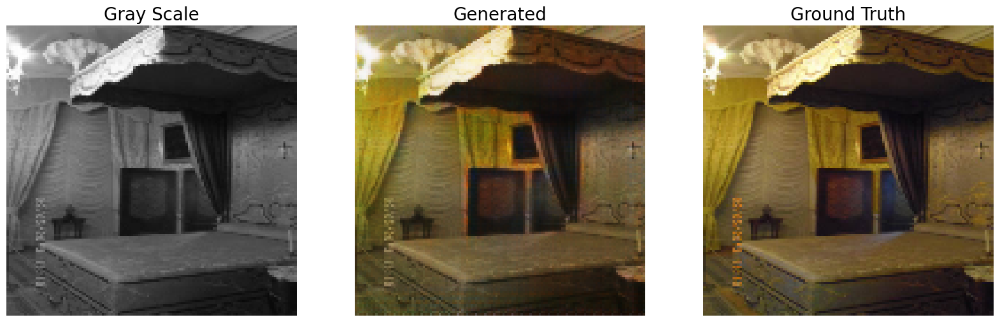

Epoch 79 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


Epoch 80 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


Epoch 81 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


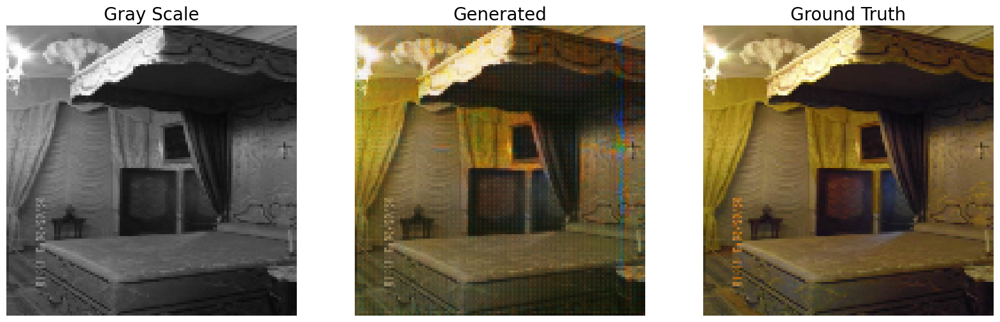

Epoch 82 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 83 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 84 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.04it/s]


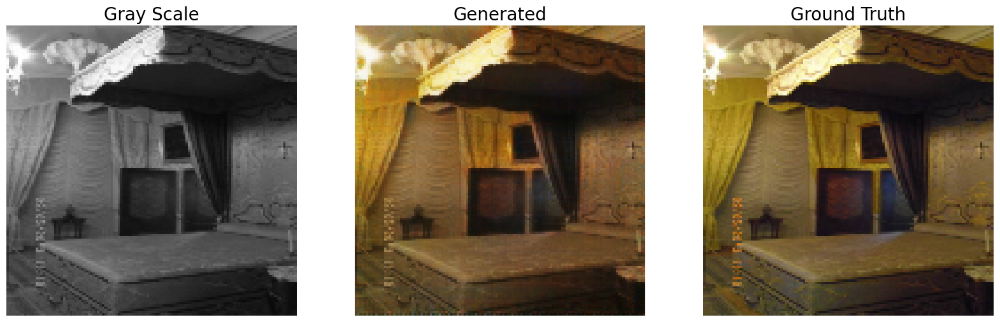

Epoch 85 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 86 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


Epoch 87 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


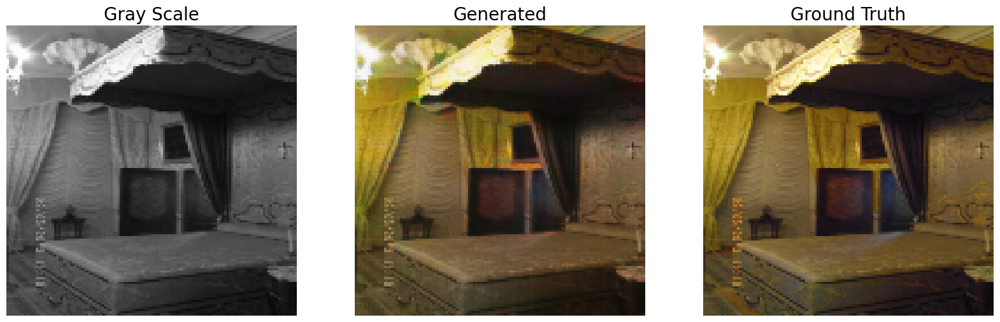

Epoch 88 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.04it/s]


Epoch 89 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 90 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


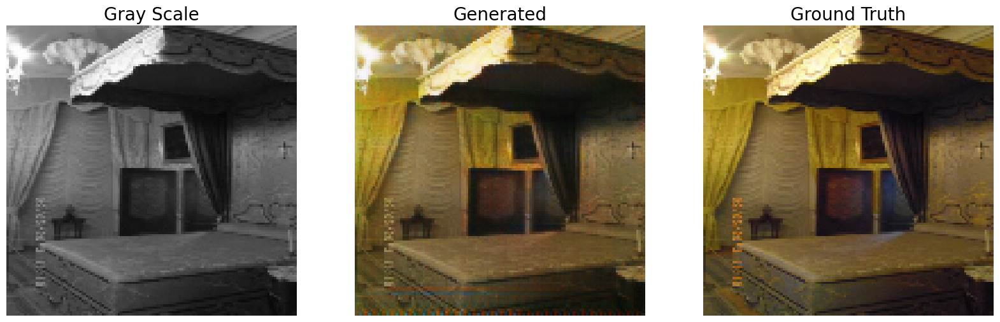

Epoch 91 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.93it/s]


Epoch 92 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


Epoch 93 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.97it/s]


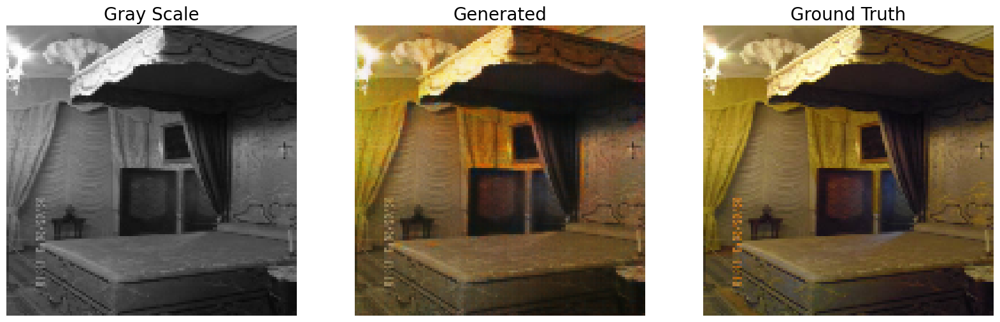

Epoch 94 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.97it/s]


Epoch 95 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 96 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


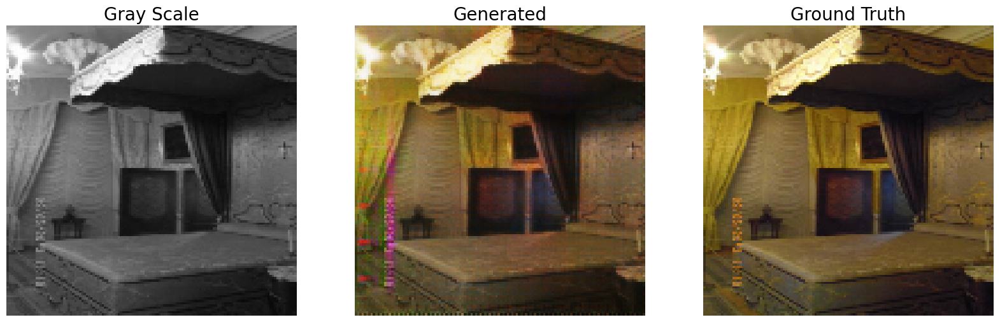

Epoch 97 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 98 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


Epoch 99 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


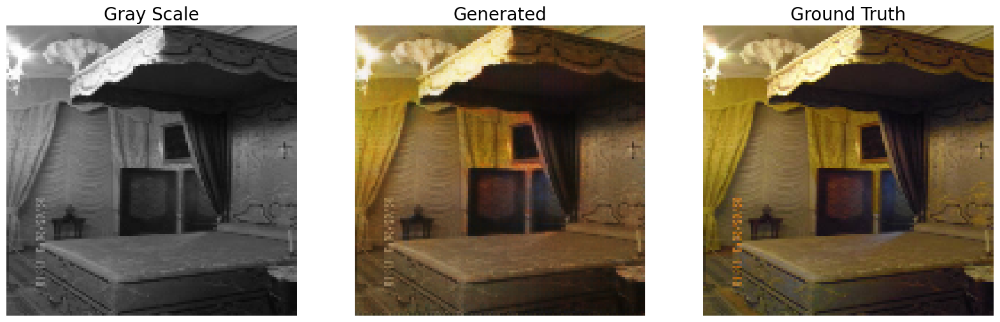

Epoch 100 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 101 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.95it/s]


Epoch 102 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


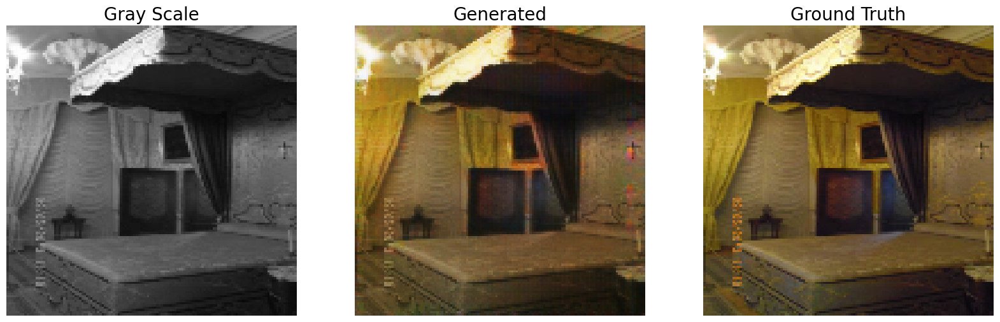

Epoch 103 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.97it/s]


Epoch 104 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.92it/s]


Epoch 105 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.93it/s]


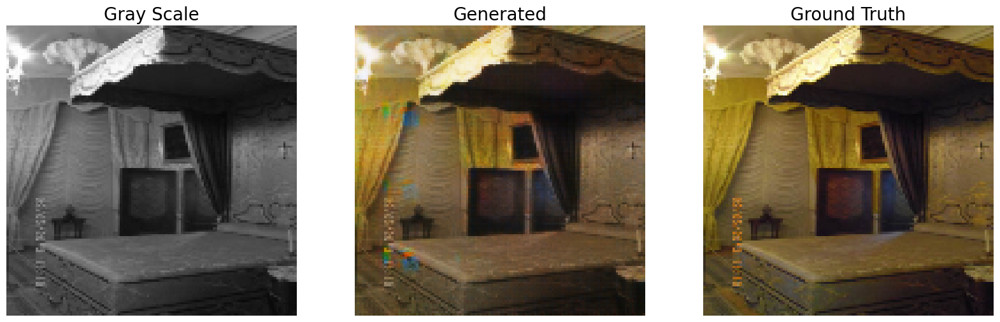

Epoch 106 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.93it/s]


Epoch 107 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 108 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


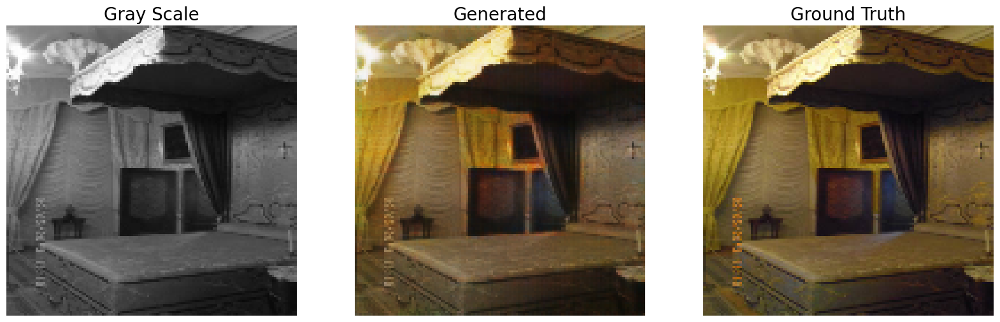

Epoch 109 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.93it/s]


Epoch 110 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.95it/s]


Epoch 111 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.95it/s]


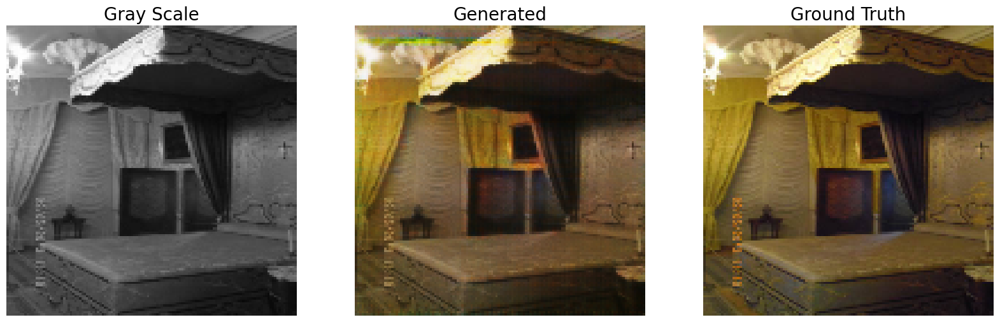

Epoch 112 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 113 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 114 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


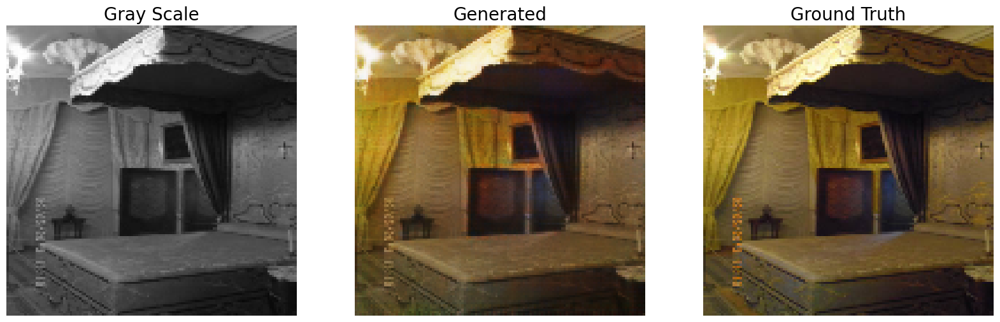

Epoch 115 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 116 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 117 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.96it/s]


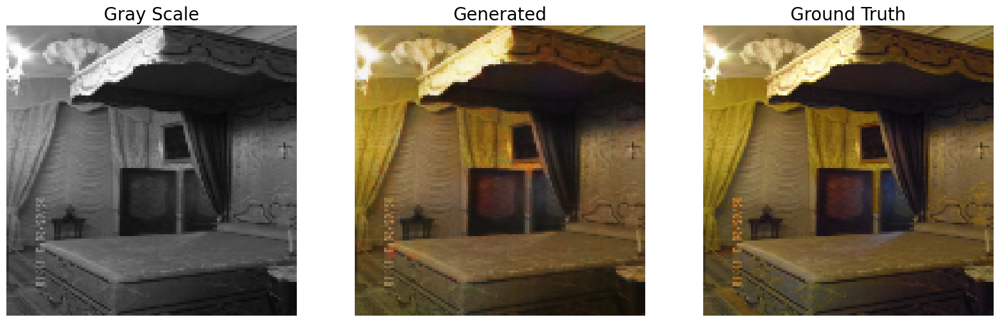

Epoch 118 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


Epoch 119 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 120 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.97it/s]


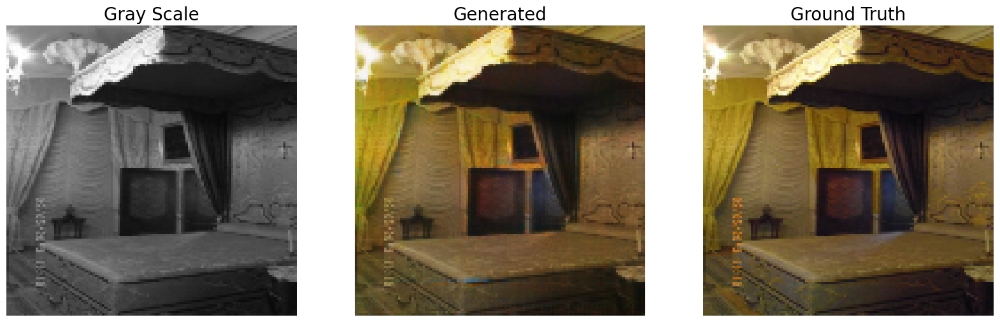

Epoch 121 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


Epoch 122 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


Epoch 123 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


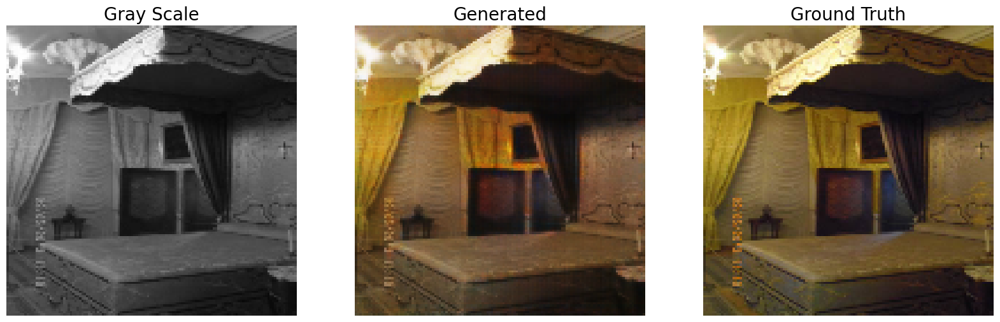

Epoch 124 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 125 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


Epoch 126 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.96it/s]


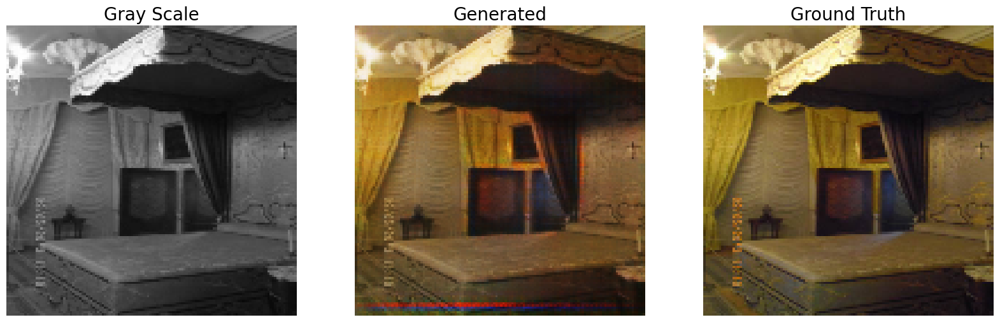

Epoch 127 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


Epoch 128 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


Epoch 129 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.77it/s]


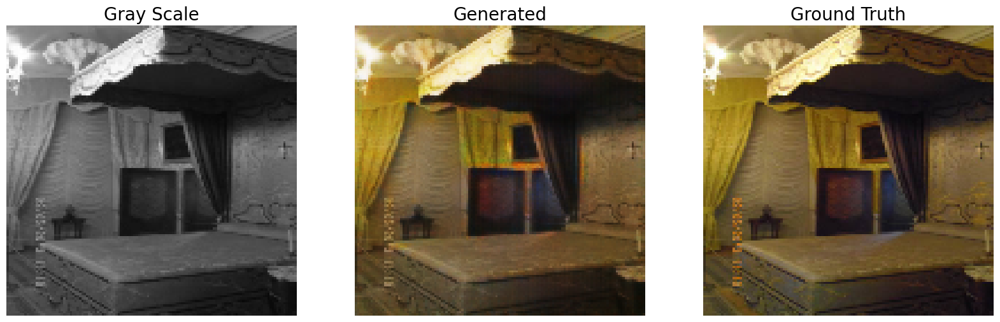

Epoch 130 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


Epoch 131 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 132 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


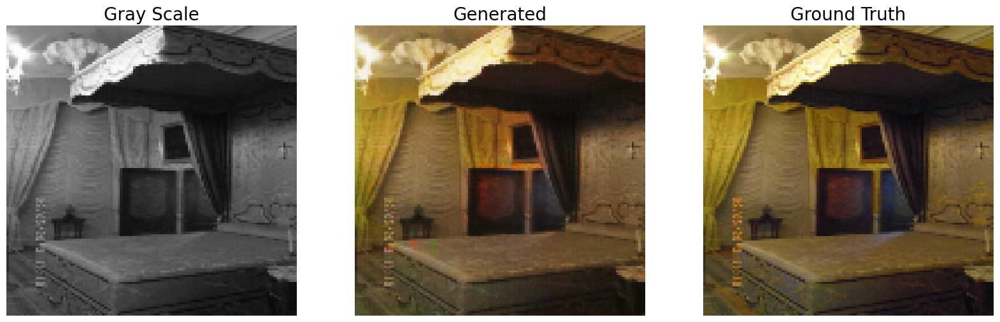

Epoch 133 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 134 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.93it/s]


Epoch 135 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


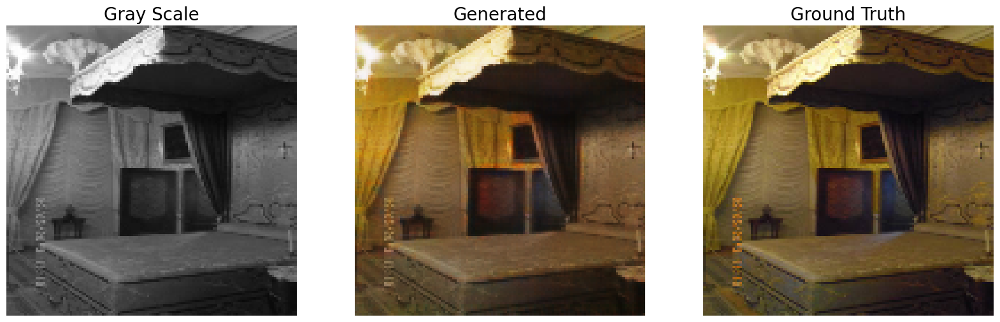

Epoch 136 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


Epoch 137 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.04it/s]


Epoch 138 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.04it/s]


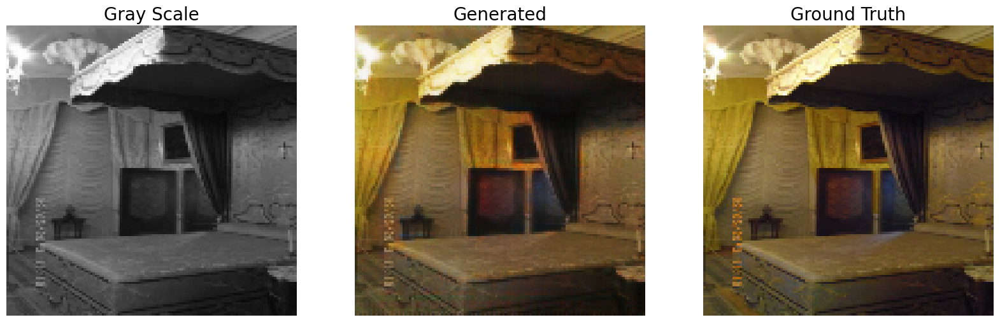

Epoch 139 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


Epoch 140 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.97it/s]


Epoch 141 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


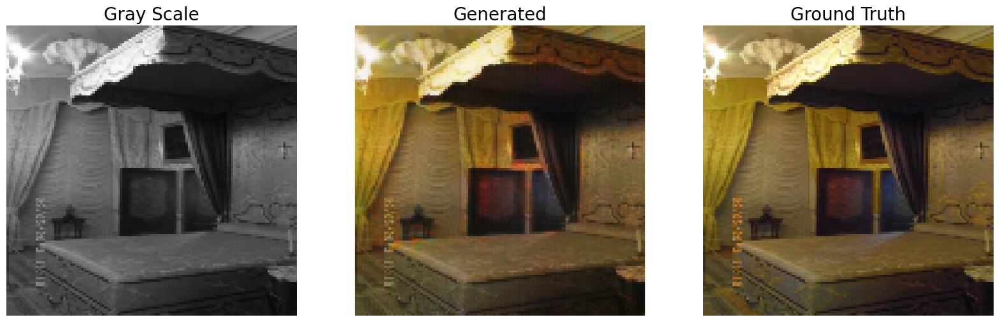

Epoch 142 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 143 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 144 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


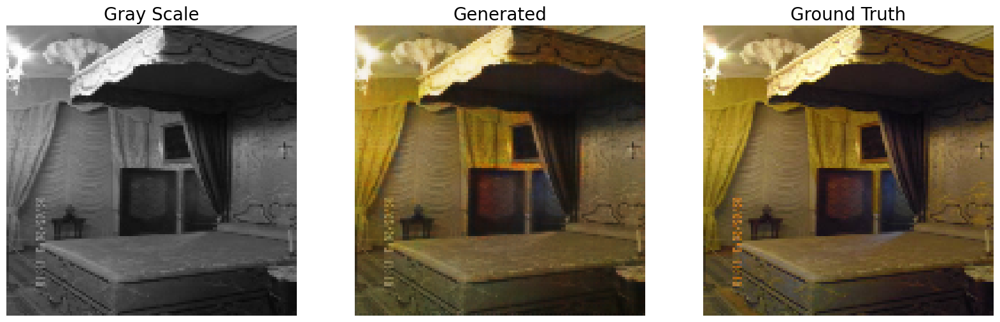

Epoch 145 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 146 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


Epoch 147 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


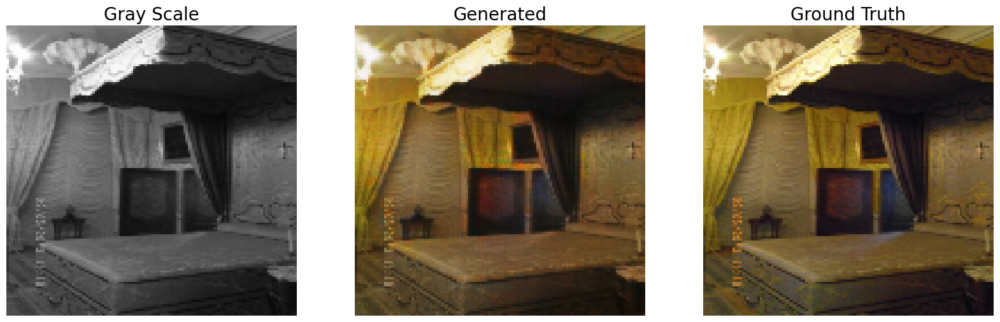

Epoch 148 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.93it/s]


Epoch 149 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 150 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


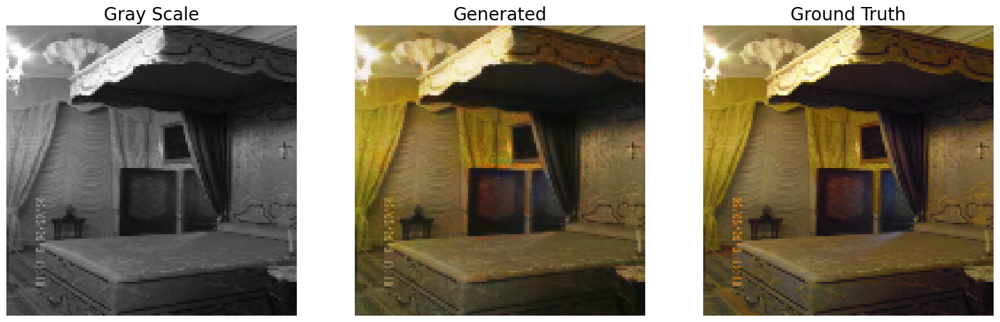

Epoch 151 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.97it/s]


Epoch 152 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


Epoch 153 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


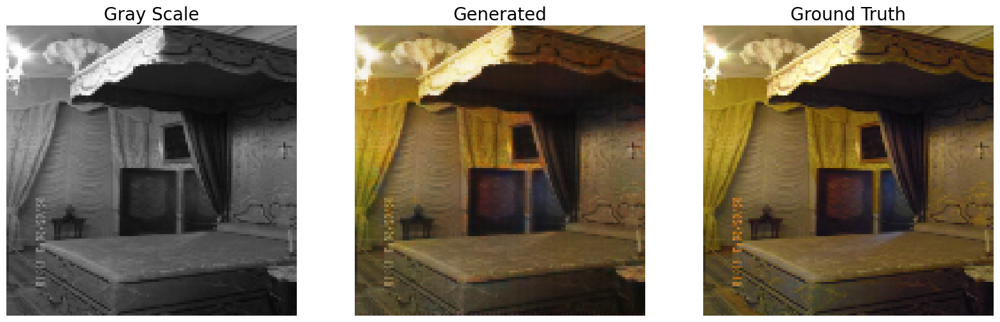

Epoch 154 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.96it/s]


Epoch 155 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


Epoch 156 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.97it/s]


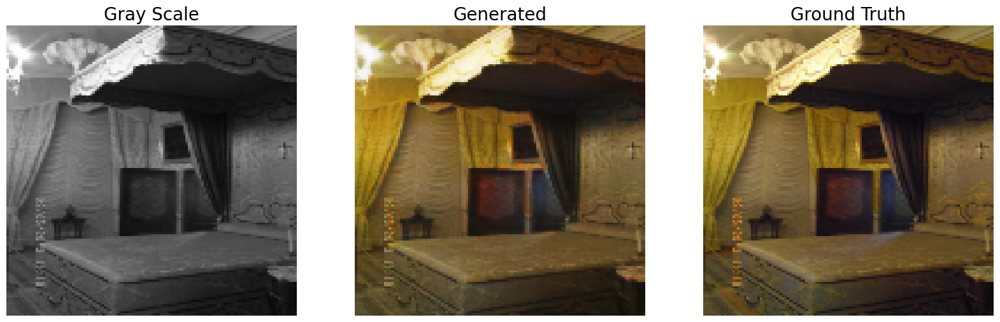

Epoch 157 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.95it/s]


Epoch 158 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


Epoch 159 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


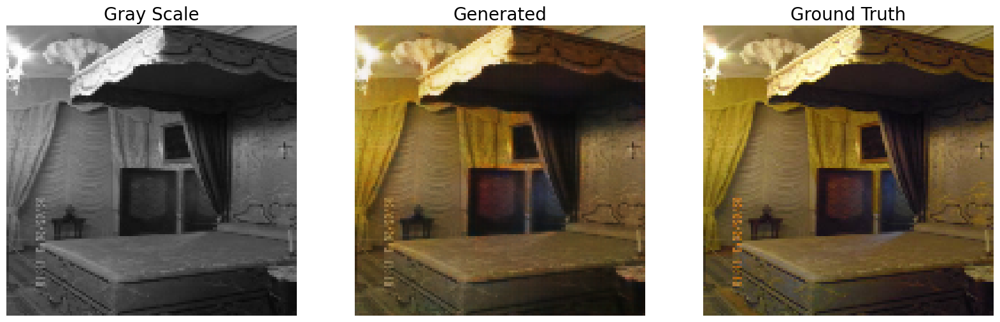

Epoch 160 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


Epoch 161 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 162 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


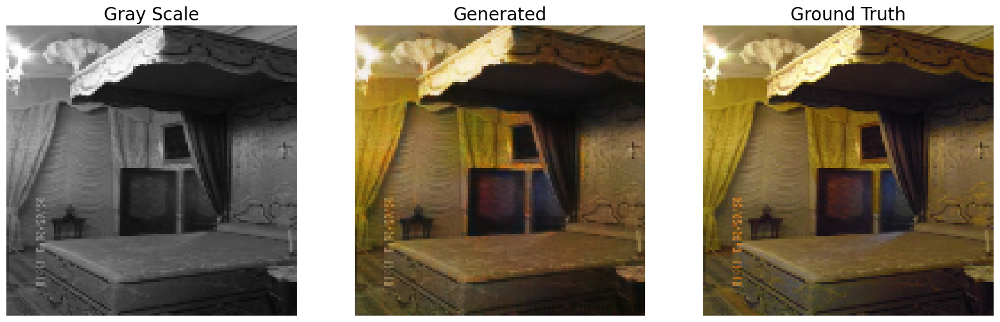

Epoch 163 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.96it/s]


Epoch 164 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.96it/s]


Epoch 165 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.87it/s]


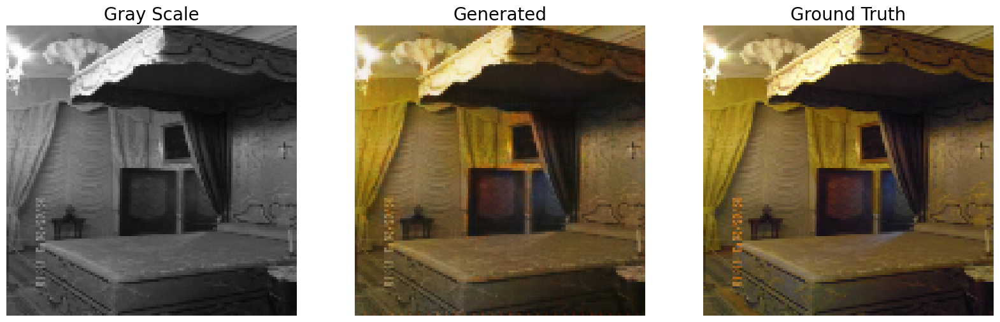

Epoch 166 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.92it/s]


Epoch 167 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


Epoch 168 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.92it/s]


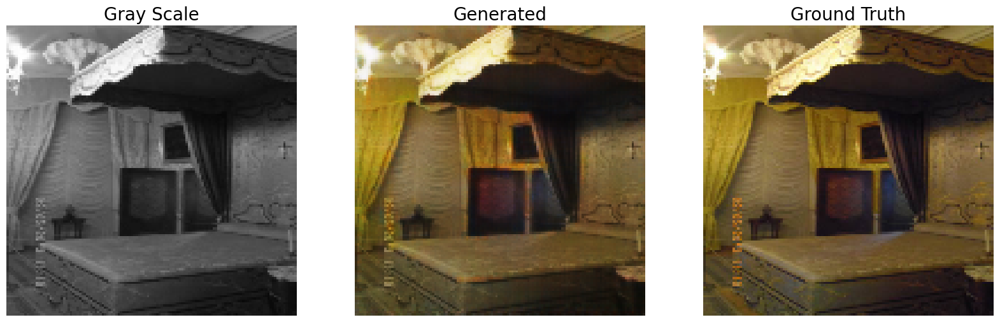

Epoch 169 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 170 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.94it/s]


Epoch 171 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.86it/s]


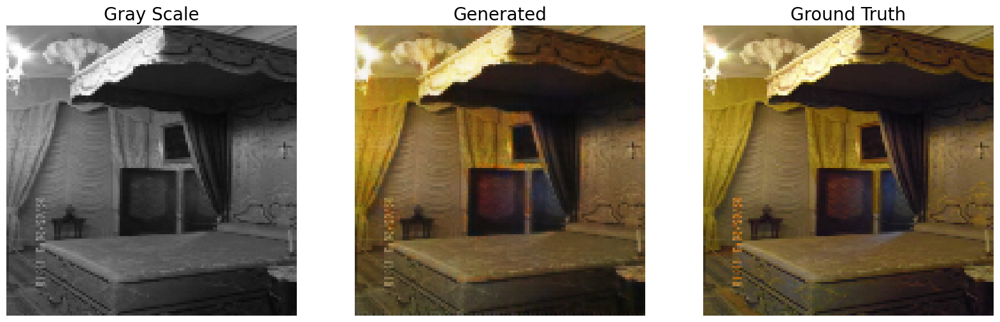

Epoch 172 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


Epoch 173 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.92it/s]


Epoch 174 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.92it/s]


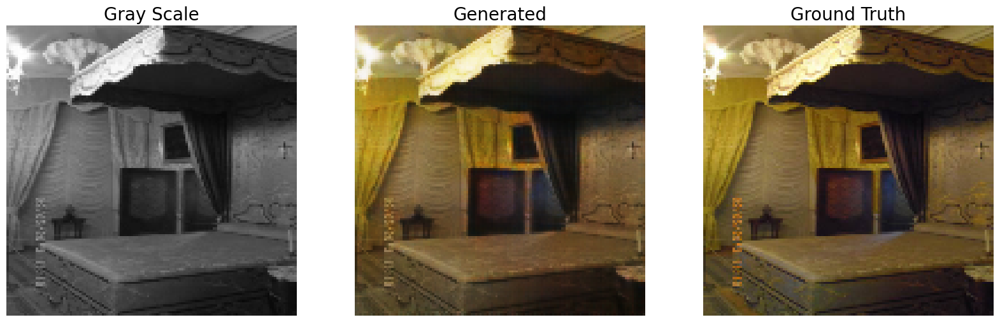

Epoch 175 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.93it/s]


Epoch 176 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 177 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


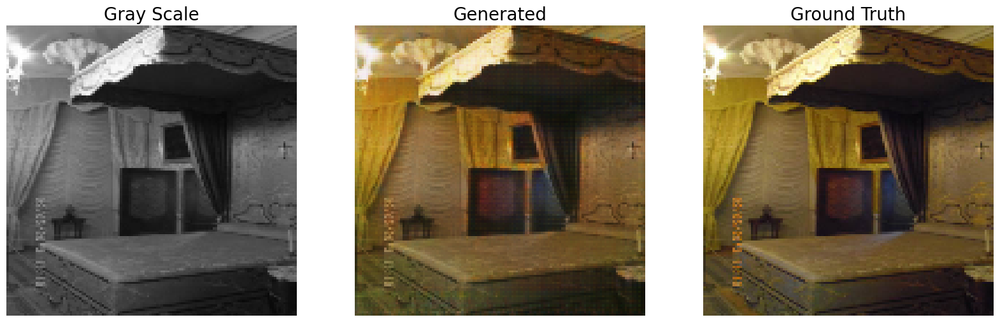

Epoch 178 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 179 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 180 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.77it/s]


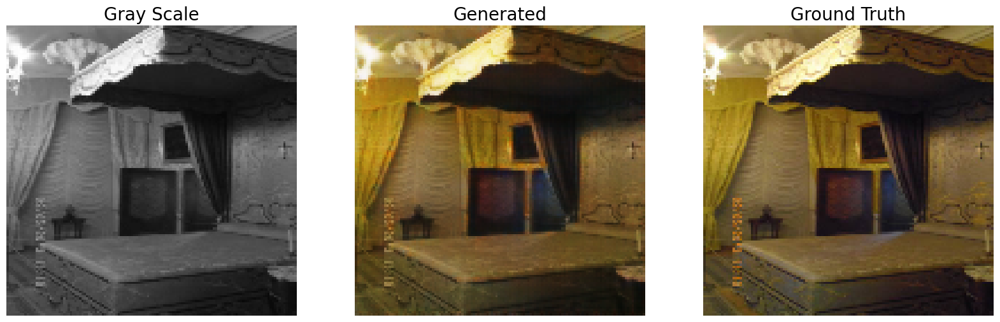

Epoch 181 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


Epoch 182 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


Epoch 183 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


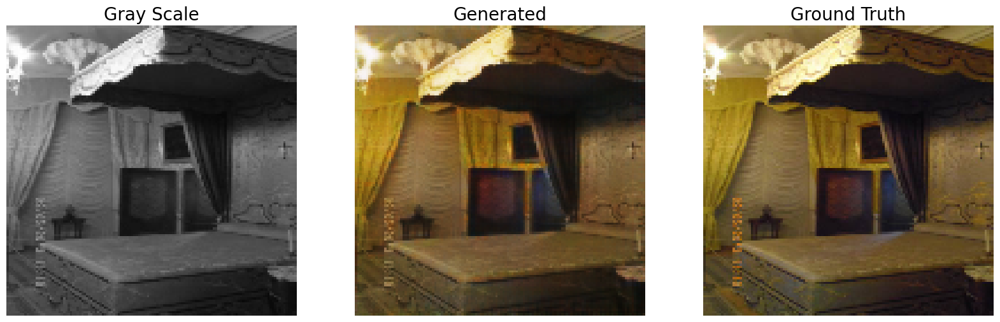

Epoch 184 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.04it/s]


Epoch 185 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.04it/s]


Epoch 186 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


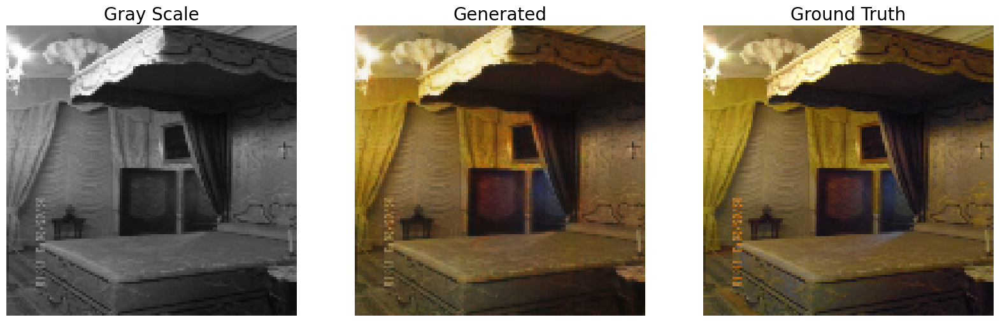

Epoch 187 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


Epoch 188 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 189 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


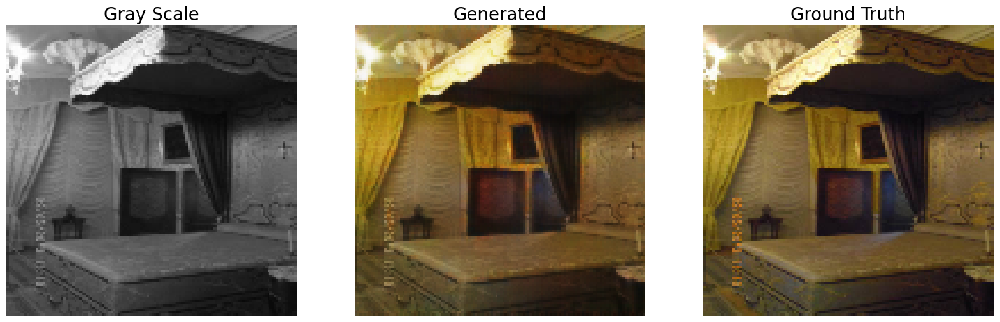

Epoch 190 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 191 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 192 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


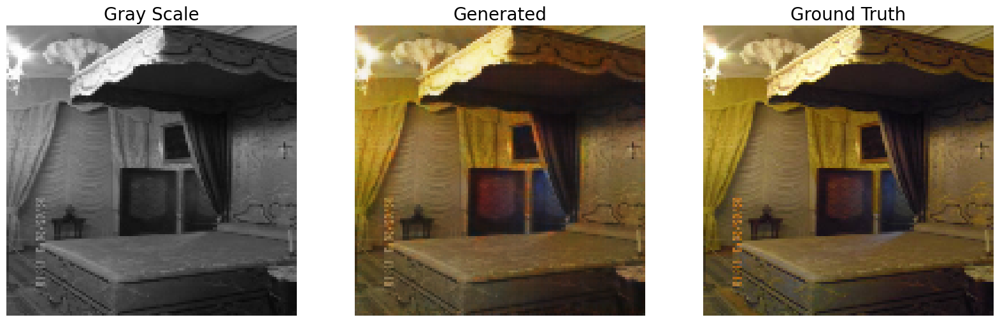

Epoch 193 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 194 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


Epoch 195 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


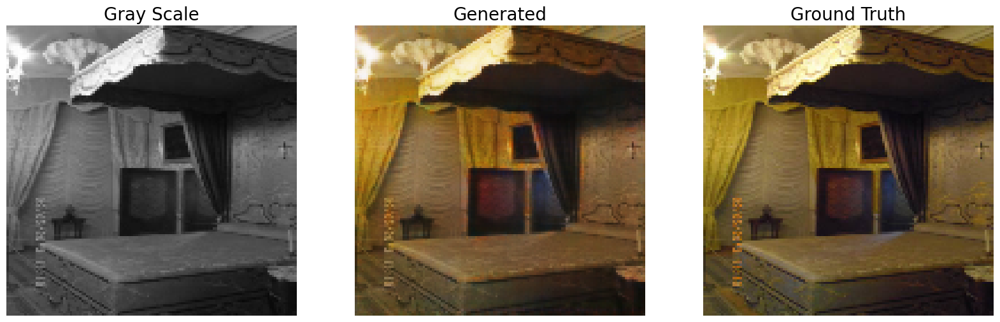

Epoch 196 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.77it/s]


Epoch 197 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


Epoch 198 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


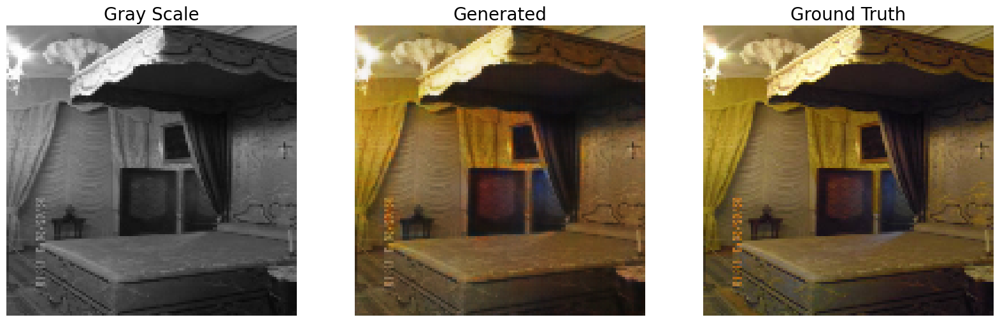

Epoch 199 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.04it/s]


Epoch 200 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


Epoch 201 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


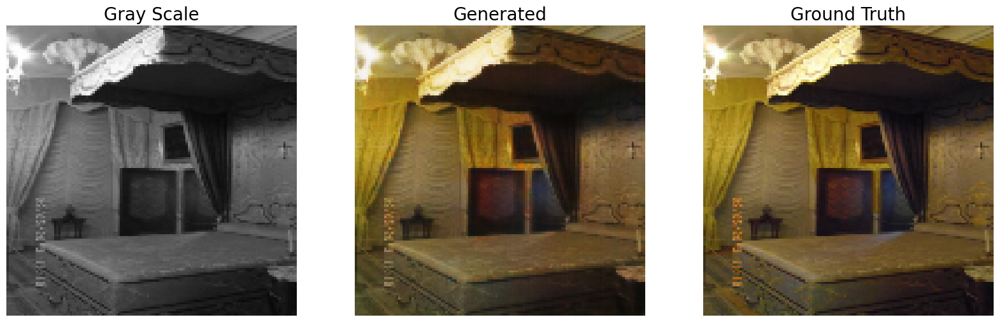

Epoch 202 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 203 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


Epoch 204 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


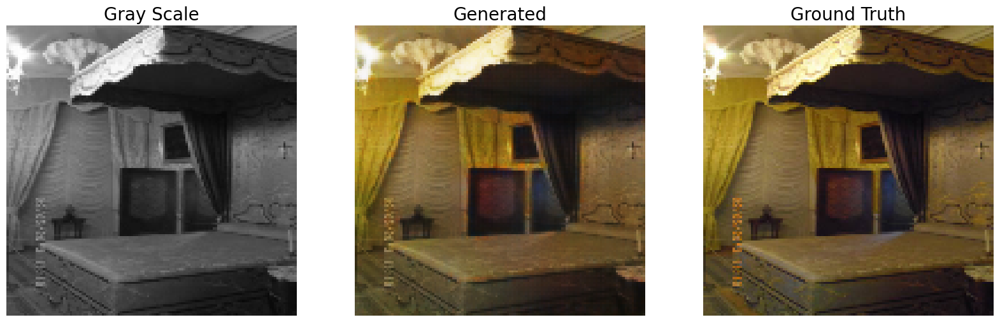

Epoch 205 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 206 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 207 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


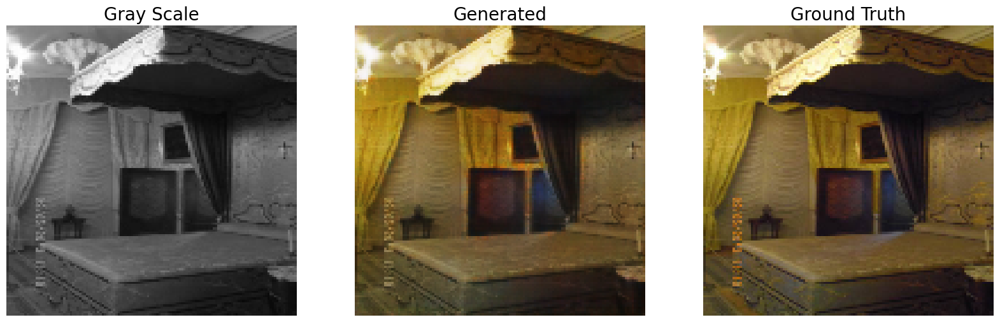

Epoch 208 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.96it/s]


Epoch 209 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.95it/s]


Epoch 210 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


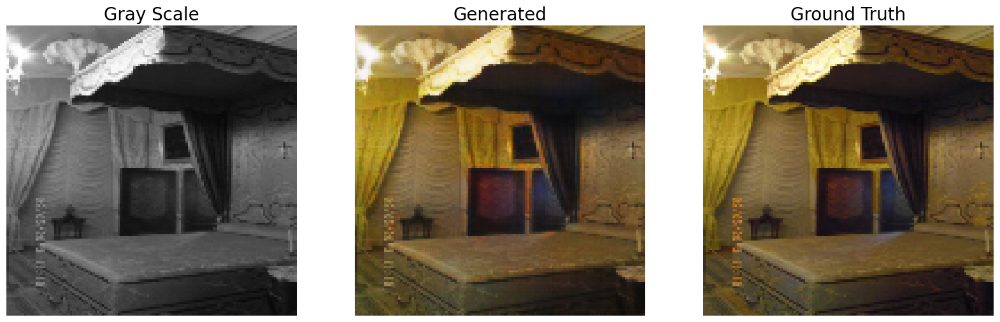

Epoch 211 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.94it/s]


Epoch 212 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


Epoch 213 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.97it/s]


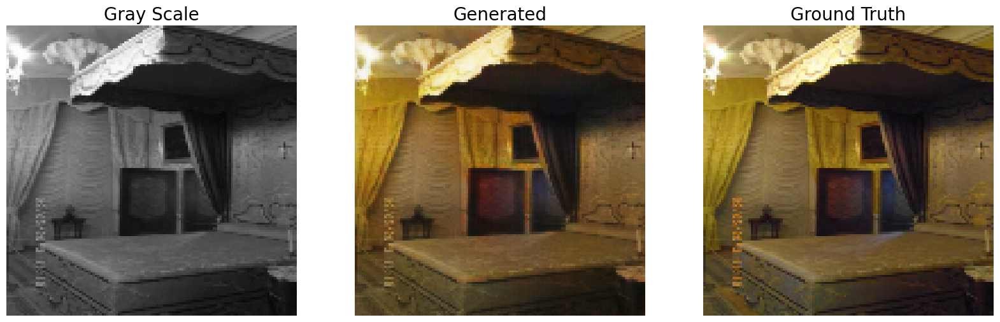

Epoch 214 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 215 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.76it/s]


Epoch 216 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


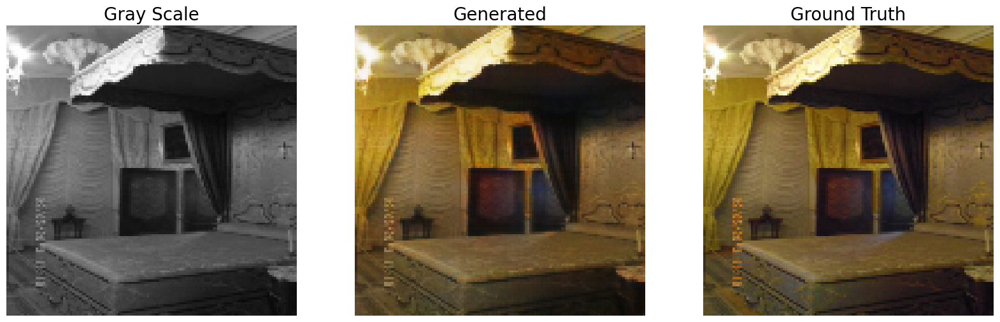

Epoch 217 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.97it/s]


Epoch 218 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


Epoch 219 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


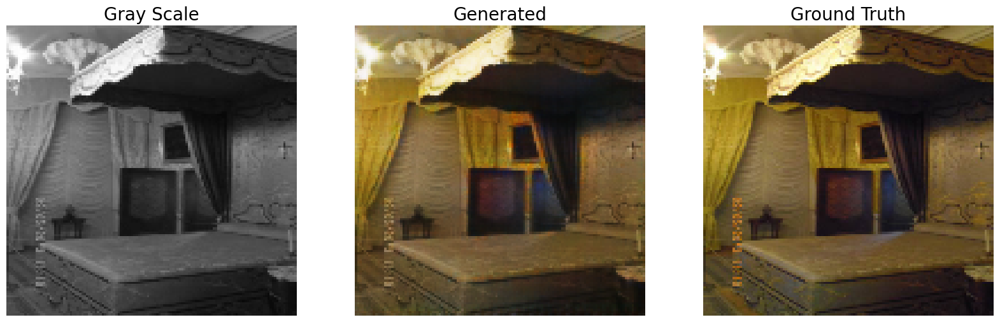

Epoch 220 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.77it/s]


Epoch 221 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 222 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


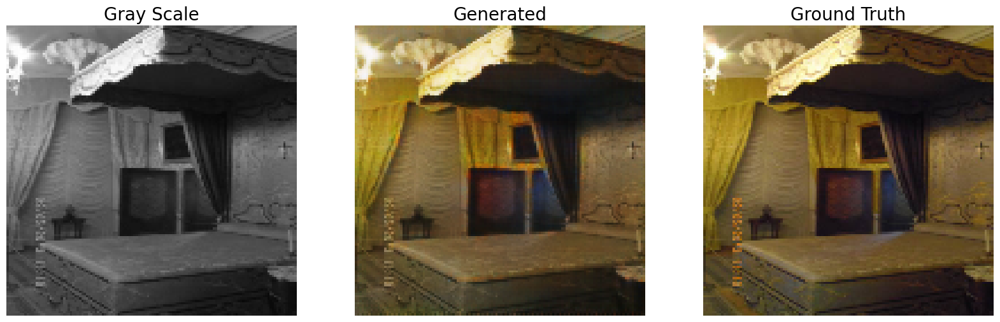

Epoch 223 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.97it/s]


Epoch 224 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


Epoch 225 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


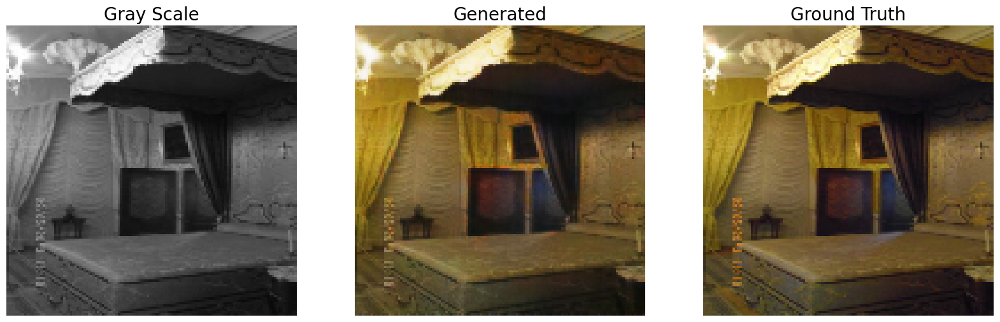

Epoch 226 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 227 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 228 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.93it/s]


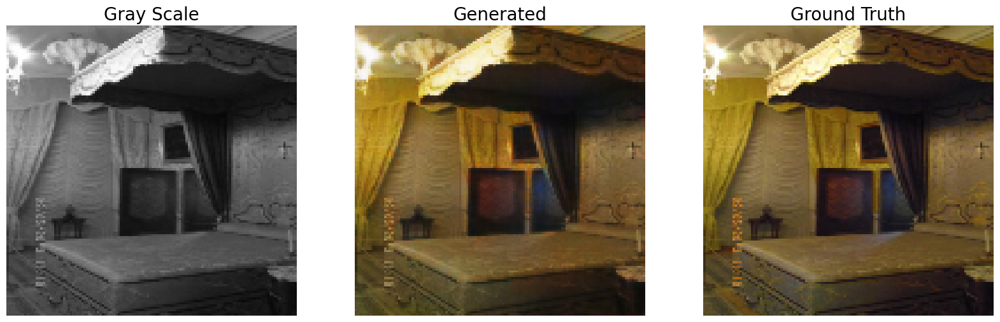

Epoch 229 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 230 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


Epoch 231 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


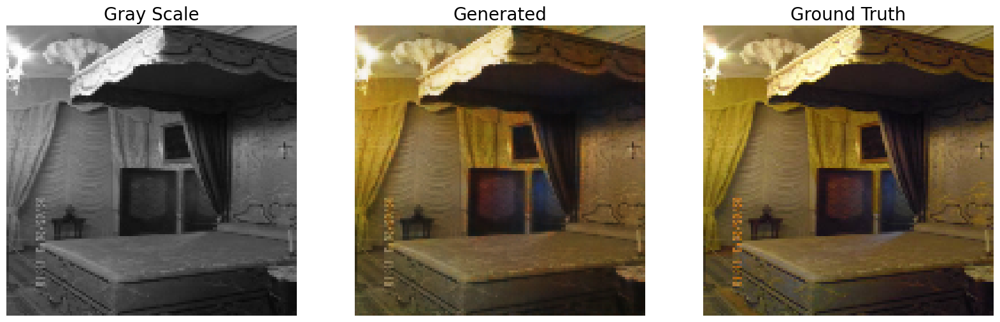

Epoch 232 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


Epoch 233 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 234 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.96it/s]


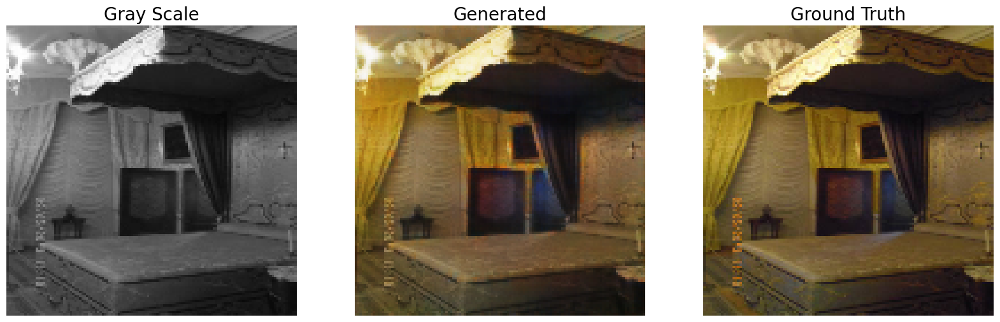

Epoch 235 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 236 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.96it/s]


Epoch 237 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


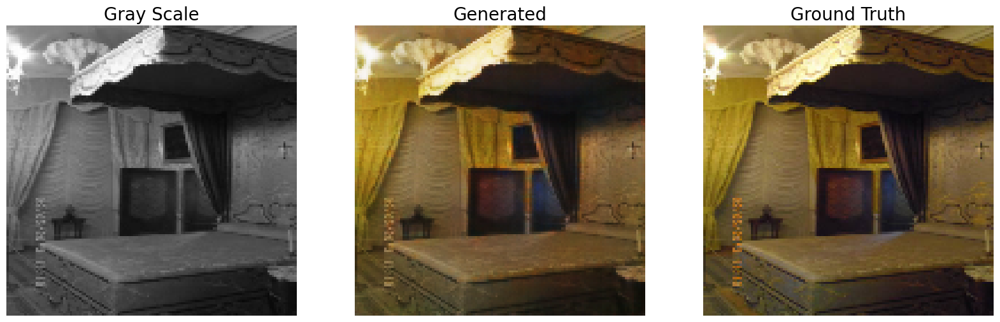

Epoch 238 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


Epoch 239 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


Epoch 240 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


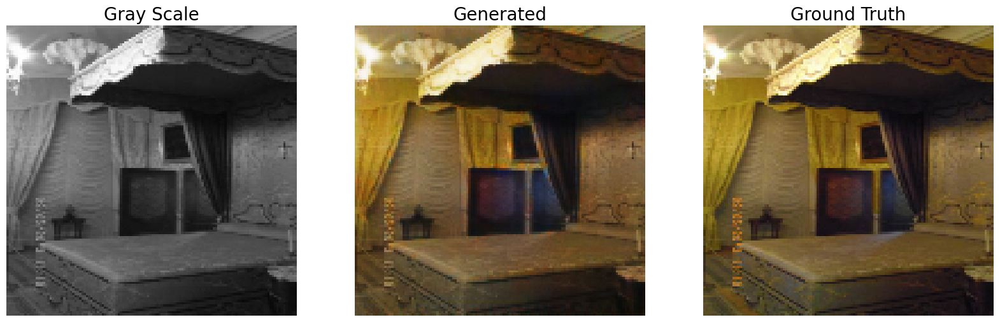

Epoch 241 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.77it/s]


Epoch 242 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 243 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


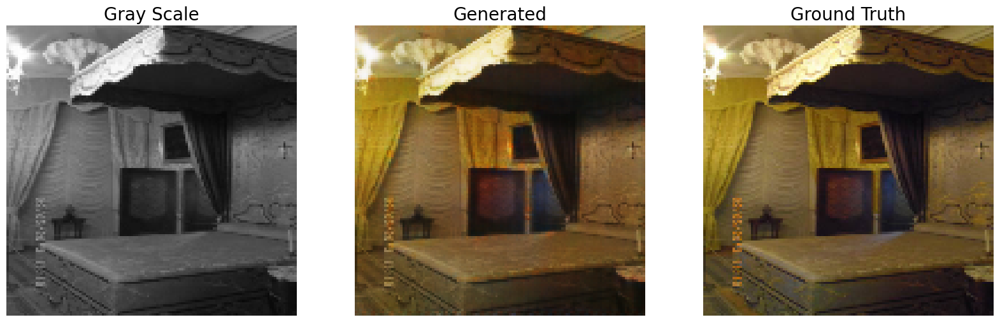

Epoch 244 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


Epoch 245 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 246 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


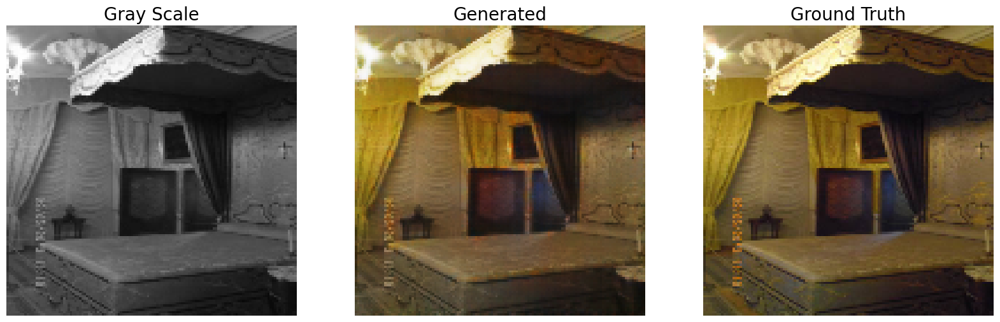

Epoch 247 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


Epoch 248 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.04it/s]


Epoch 249 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


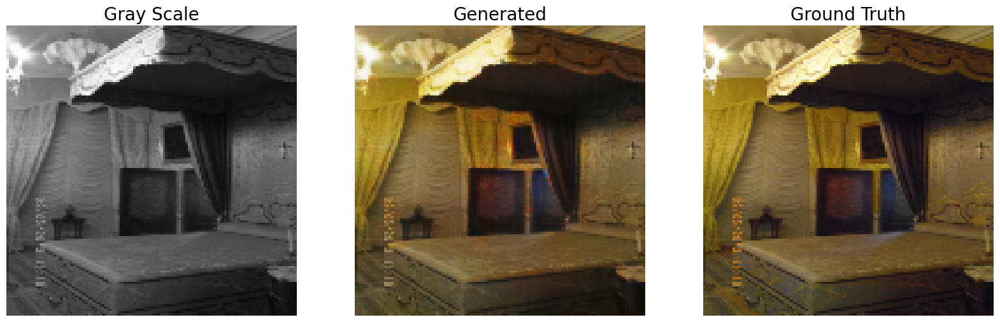

Epoch 250 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.95it/s]


Epoch 251 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 252 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


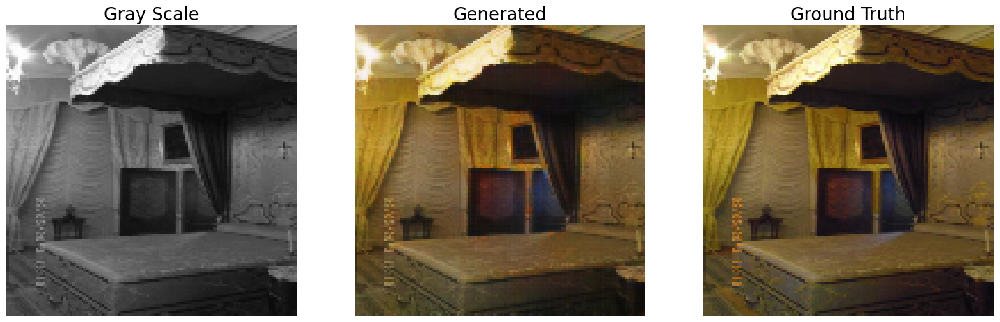

Epoch 253 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.97it/s]


Epoch 254 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.04it/s]


Epoch 255 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.04it/s]


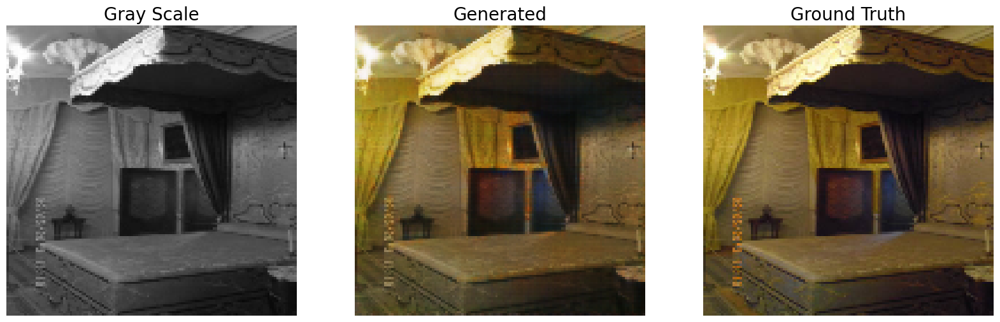

Epoch 256 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 257 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 258 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


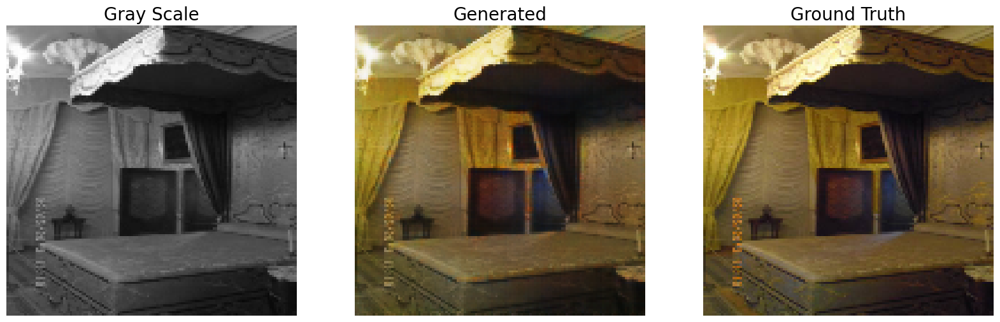

Epoch 259 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


Epoch 260 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


Epoch 261 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


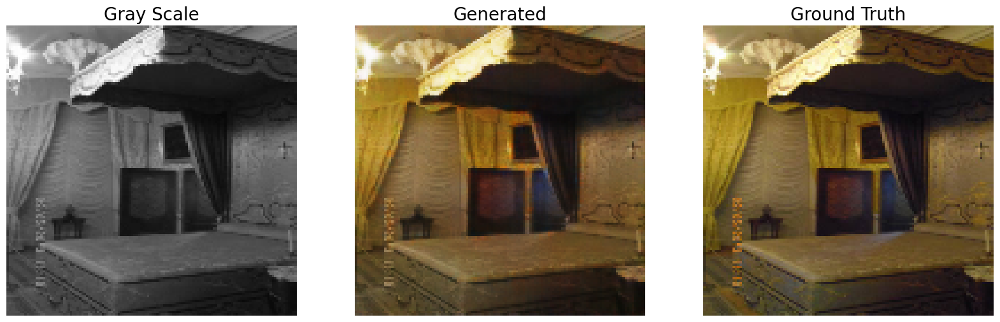

Epoch 262 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 263 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


Epoch 264 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.04it/s]


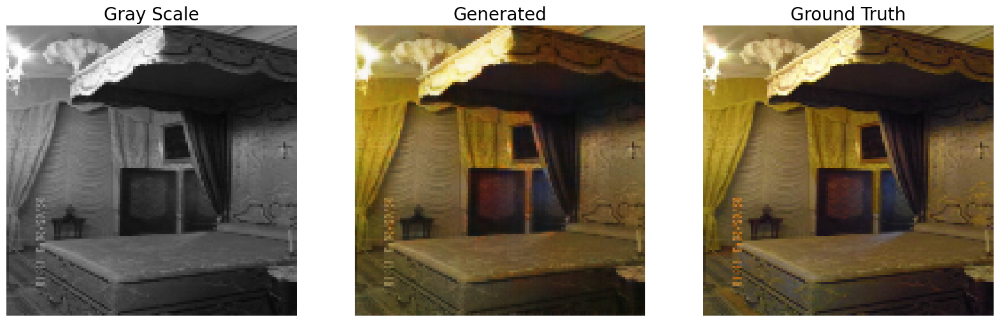

Epoch 265 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.04it/s]


Epoch 266 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 267 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.00it/s]


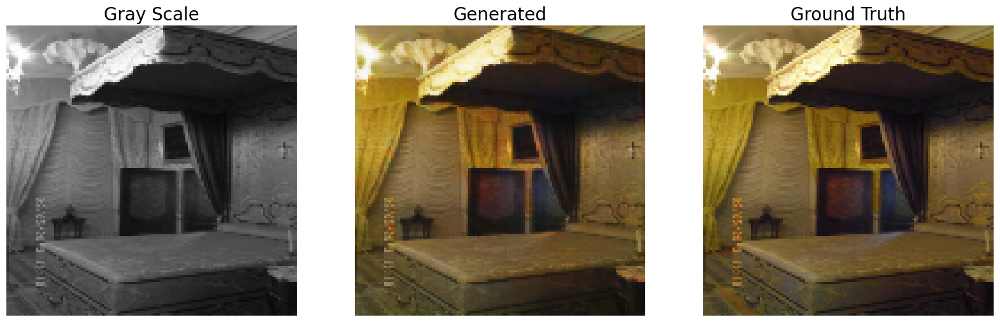

Epoch 268 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


Epoch 269 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.96it/s]


Epoch 270 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


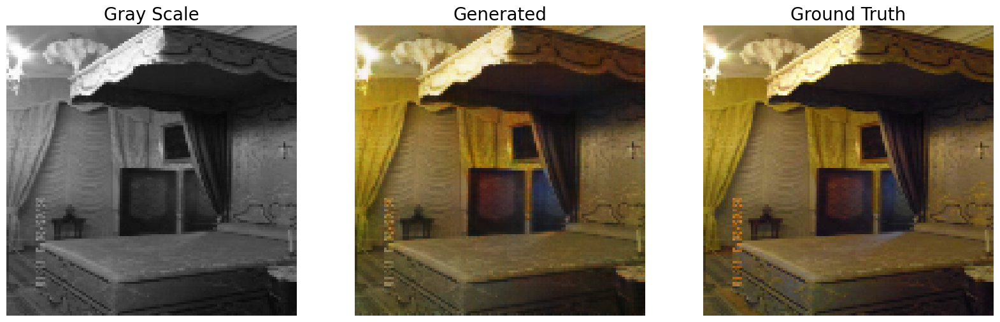

Epoch 271 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


Epoch 272 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


Epoch 273 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


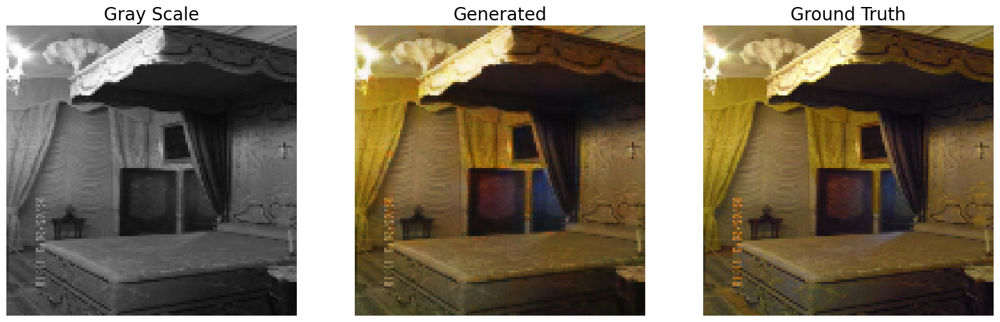

Epoch 274 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 275 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 276 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


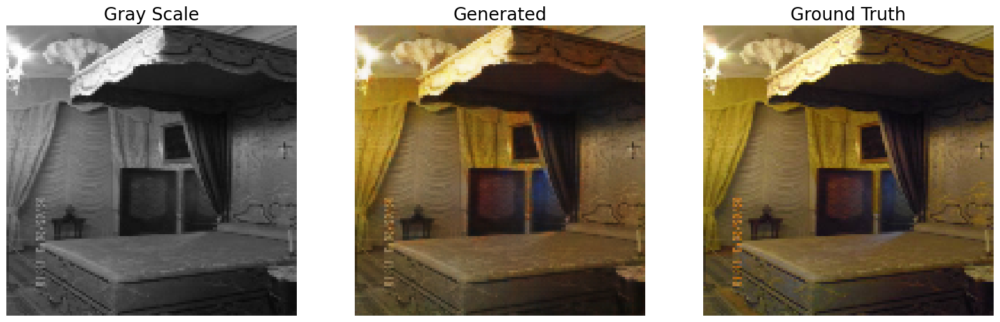

Epoch 277 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


Epoch 278 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 279 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


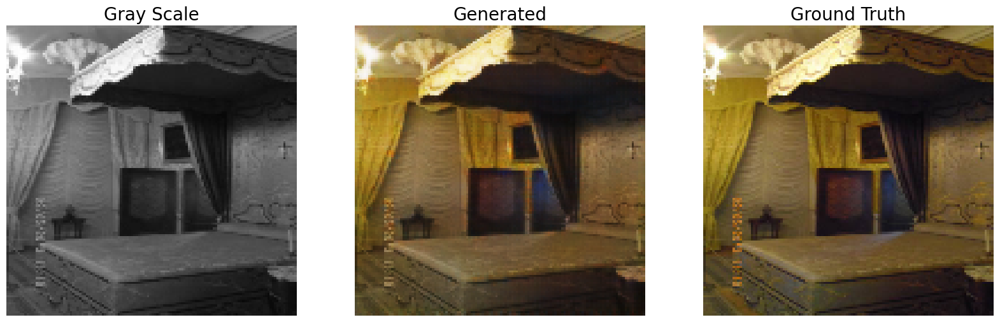

Epoch 280 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.99it/s]


Epoch 281 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.03it/s]


Epoch 282 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


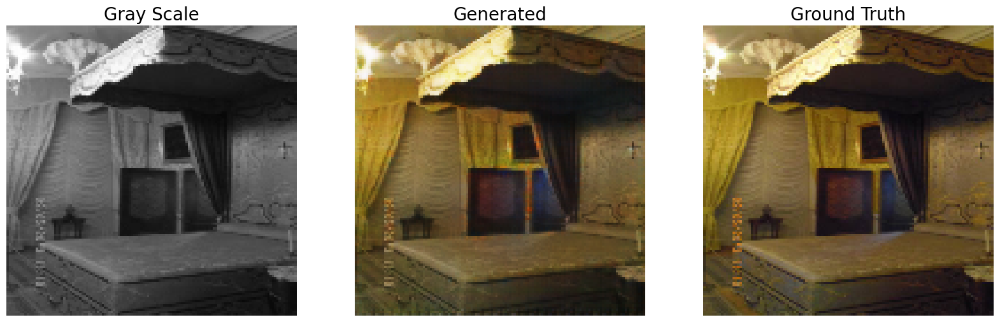

Epoch 283 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.97it/s]


Epoch 284 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 285 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.77it/s]


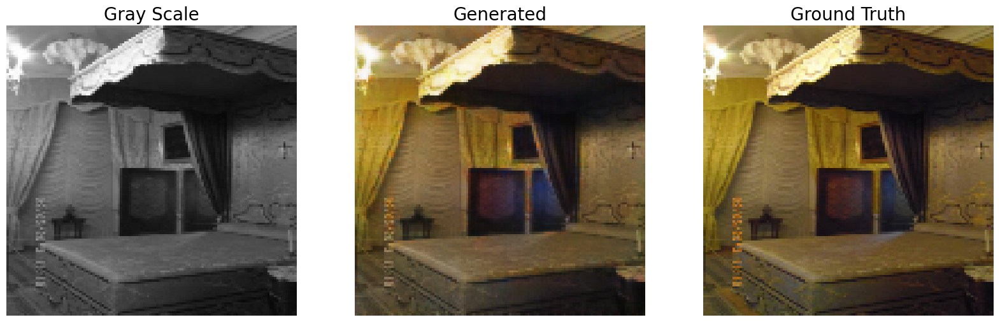

Epoch 286 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.95it/s]


Epoch 287 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 288 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.04it/s]


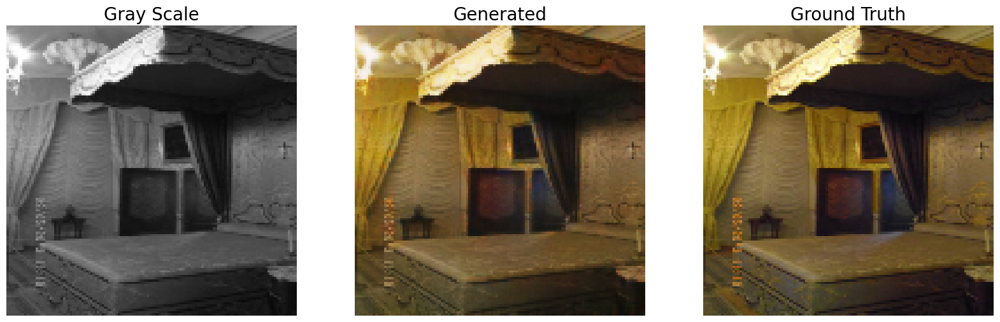

Epoch 289 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


Epoch 290 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


Epoch 291 out of 300


100%|██████████| 282/282 [00:20<00:00, 13.78it/s]


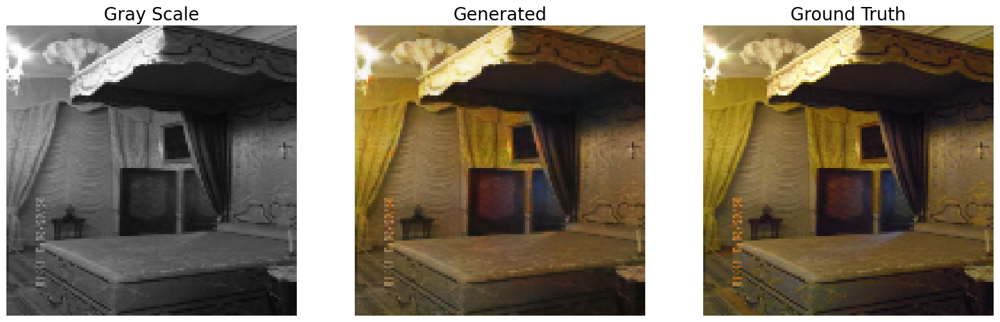

Epoch 292 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.94it/s]


Epoch 293 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.01it/s]


Epoch 294 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


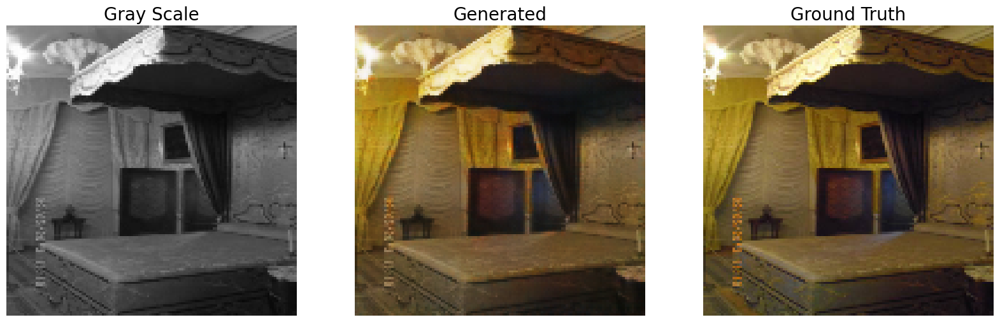

Epoch 295 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


Epoch 296 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.97it/s]


Epoch 297 out of 300


100%|██████████| 282/282 [00:17<00:00, 16.02it/s]


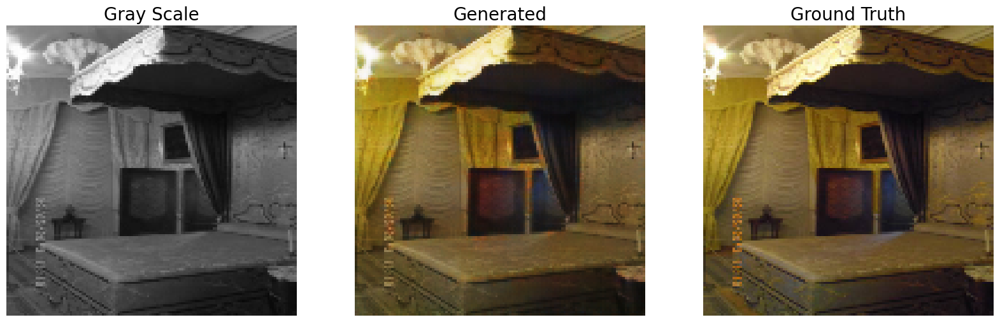

Epoch 298 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.97it/s]


Epoch 299 out of 300


100%|██████████| 282/282 [00:17<00:00, 15.98it/s]


In [ ]:
fit(EPOCHS = 300)